# TODO Titolo

## Initialization

### imports

Data download related

In [ ]:
import os
from os import path   # system path
from os import mkdir  # create a directory
from glob import glob # query folders
import requests       # download
import zipfile        # extract zip files
from tqdm import tqdm # progress bar

Data manipulation

In [ ]:
import geopandas as gpd # geo Pandas
import pandas as pd # Pandas
import matplotlib.pyplot as plt # to make graphs
import random # random
import numpy as np # numpy
import math
from geopy.distance import distance
from shapely import wkt
from shapely.geometry import Point, Polygon, MultiPolygon, LineString, MultiLineString # to deal with geometries

### data

In [ ]:
COLAB = None
try:
    # only for google drive linking (on Colab)
    from google.colab import drive
    # Link Google Drive account to use relative pathnames
    drive.mount("/content/gdrive", readonly = False)
    COLAB = True
except:
    COLAB = False
print("Notbook is running in Colab environment:", COLAB)

Mounted at /content/gdrive
Notbook is running in Colab environment: True


In [ ]:
CSV_AND_JSON_FOLDER = "/content/gdrive/MyDrive/Data Science/smart cities/CSVs and JSONs from notebooks" # Edo Colab
#CSV_AND_JSON_FOLDER = "/content/gdrive/MyDrive/smart cities/CSVs and JSONs from notebooks" # Davide Colab

In [ ]:
# Elenca tutti i file nella cartella
files = os.listdir(CSV_AND_JSON_FOLDER)

# Filtra solo i file CSV
csv_files = [f for f in files if f.endswith('csv')]

# Crea due dizionari per memorizzare i DataFrame
pd_dataframes = {}
gpd_dataframes = {}

# Leggi ogni file CSV in un DataFrame
for csv_file in csv_files:
    file_path = os.path.join(CSV_AND_JSON_FOLDER, csv_file)
    pd_dataframes[csv_file] = pd.read_csv(file_path, low_memory=False)
    print(f"Imported {csv_file}")

# Filtra solo i file JSON
json_files = [f for f in files if f.endswith('json')]

# Leggi ogni file JSON in un DataFrame
for json_file in json_files:
    file_path = os.path.join(CSV_AND_JSON_FOLDER, json_file)
    gpd_dataframes[json_file] = gpd.read_file(file_path)
    print(f"Imported {json_file}")

# Filtra solo i file feather
feather_files = [f for f in files if f.endswith('feather')]

# Leggi ogni file feather in un DataFrame
for feather_file in feather_files:
    file_path = os.path.join(CSV_AND_JSON_FOLDER, feather_file)
    gpd_dataframes[feather_file] = gpd.read_feather(file_path)
    print(f"Imported {feather_file}")

Imported green_divided_in_areas.csv
Imported air_sc.csv
Imported air_milano.csv
Imported buildings_divided_in_areas.csv
Imported green_points.json
Imported comune.json
Imported stations_milano.json
Imported sc_stations.json
Imported osm_milano_natural.json
Imported osm_milano_buildings.json
Imported osm_milano_streets.json
Imported buildings_points.feather
Imported green_divided_in_areas.feather
Imported green_points.feather
Imported hypotetical_scalofarini_in_areas.feather


In [ ]:
stations_milano = gpd_dataframes['stations_milano.json']
stations_milano.head()

,id,name,id_arpa,inizio_operativita,fine_operativita,inquinanti,dataset,entity,source,color,geometry
0,2,via Pascal *,100,1900-01-01,2099-12-31,"NO2, SO2, PM25, SO2, O3, PM10, C6H6",stations_milano,station,milano,blue,POINT (518351.042 5035645.702)
1,4,viale Marche,2,1900-01-01,2099-12-31,"C6H6, CO_8h, PM25, PM10, NO2",stations_milano,station,milano,blue,POINT (514910.677 5038103.127)
2,6,via Senato *,125,1900-01-01,2099-12-31,"PM25, PM10, C6H6, CO_8h, NO2",stations_milano,station,milano,blue,POINT (515470.916 5035238.303)
3,7,Verziere,85,1900-01-01,2099-12-31,"O3, PM10, NO2, CO_8h",stations_milano,station,milano,blue,POINT (515271.158 5034460.138)


In [ ]:
sc_stations = gpd_dataframes['sc_stations.json']
sc_stations.head()

,id,name,Latitude,Longitude,dataset,entity,source,color,geometry
0,#44216,Centro,45.4617222,9.182333333333332,sc_chosen_stations,station_sc,sensor community,red,POINT (514254.769 5034260.134)
1,#40256,Porta Vittoria,45.462109495758476,9.209781789416478,sc_chosen_stations,station_sc,sensor community,red,POINT (516400.569 5034308.395)
2,#32399,Via Meda,45.43998127831078,9.178070145718733,sc_chosen_stations,station_sc,sensor community,red,POINT (513926.824 5031844.054)
3,#70169,Lodi,45.442101399035224,9.21225714798778,sc_chosen_stations,station_sc,sensor community,red,POINT (516599.959 5032086.080)
4,#50128,Piazza Leonardo,45.47777813047526,9.224090852257673,sc_chosen_stations,station_sc,sensor community,red,POINT (517514.386 5036052.144)


In [ ]:
air_milano = pd_dataframes['air_milano.csv']
air_milano.head()

,stazione_id,month,C6H6,C6H6_measurements,CO_8h,CO_8h_measurements,NO2,NO2_measurements,O3,O3_measurements,PM10,PM10_measurements,"PM2,5","PM2,5_measurements",SO2,SO2_measurements
0,2,1,2.457143,21,NaN,0,57.142857,21,26.095238,21,33.238095,21,24.333333,21,3.619048,21
1,2,2,2.145000,20,NaN,0,69.400000,20,58.250000,20,47.850000,20,29.900000,20,4.550000,20
2,2,3,1.026087,23,NaN,0,62.217391,23,74.608696,23,29.173913,23,16.913043,23,3.739130,23
3,2,4,0.647059,17,NaN,0,42.000000,14,85.117647,17,18.588235,17,9.411765,17,4.308824,17
4,2,5,0.550000,22,NaN,0,32.904762,21,93.000000,22,14.772727,22,9.272727,22,2.886364,22


In [ ]:
air_sc = pd_dataframes['air_sc.csv']
air_sc.head()

,month,PM10,PM10_measurements,"PM2,5","PM2,5_measurements",sensor_id,sensor_type,location,lat,lon
0,1,30.730758,13490,20.968428,13490,44216,SDS011,29885,45.461683,9.182103
1,2,35.931124,13856,23.128715,13856,44216,SDS011,29885,45.461683,9.182103
2,3,20.303564,12872,14.347259,12872,44216,SDS011,29885,45.461683,9.182103
3,4,9.433302,6593,7.428934,6593,44216,SDS011,29885,45.461683,9.182103
4,5,9.086172,17712,7.302746,17712,44216,SDS011,29885,45.461683,9.182103


In [ ]:
green_points = gpd_dataframes['green_points.feather']
green_points.head()

,natural,lon,lat,geometry,dataset
0,tree,9.203583,45.464874,POINT (515915.156 5034614.305),osm_milano_natural
1,tree,9.154628,45.437714,POINT (512093.888 5031588.334),osm_milano_natural
2,tree,9.154697,45.437599,POINT (512099.357 5031575.631),osm_milano_natural
3,tree,9.153111,45.437283,POINT (511975.307 5031540.218),osm_milano_natural
4,tree,9.154371,45.437309,POINT (512073.909 5031543.373),osm_milano_natural


In [ ]:
green_points.shape

(788512, 5)

In [ ]:
buildings_points = gpd_dataframes['buildings_points.feather']
buildings_points.head()

,lat,lon,geometry,dataset
0,5.034989e+06,512229.779268,POINT (512229.779 5034988.595),osm_milano_building
1,5.034813e+06,512025.918517,POINT (512025.919 5034812.523),osm_milano_building
2,5.034195e+06,512045.842972,POINT (512045.843 5034195.149),osm_milano_building
3,5.034371e+06,512217.325042,POINT (512217.325 5034371.292),osm_milano_building
4,5.036927e+06,515892.384926,POINT (515892.385 5036926.663),osm_milano_building


In [ ]:
green_divided_in_areas = gpd_dataframes['green_divided_in_areas.feather']
green_divided_in_areas.head()

,stazione,natural,geometry,distance,raggio,angolo,settore,area
0,#44216,tree,POINT (515915.156 5034614.305),1697.740783,2000.0,77.958906,2,2000.0-2
1,#44216,tree,POINT (512093.888 5031588.334),3436.265096,inf,-141.034979,5,inf-5
2,#44216,tree,POINT (512099.357 5031575.631),3442.724693,inf,-141.238705,5,inf-5
3,#44216,tree,POINT (511975.307 5031540.218),3548.786585,inf,-140.034854,5,inf-5
4,#44216,tree,POINT (512073.909 5031543.373),3483.810266,inf,-141.244502,5,inf-5


In [ ]:
buildings_divided_in_areas = pd_dataframes['buildings_divided_in_areas.csv']
buildings_divided_in_areas["geometry"] = buildings_divided_in_areas["geometry"].apply(wkt.loads)
buildings_divided_in_areas = gpd.GeoDataFrame(buildings_divided_in_areas, crs = "EPSG:32632")
buildings_divided_in_areas.head()

,stazione,geometry,distance,raggio,angolo,settore,area
0,#44216,POINT (512229.779 5034988.595),2152.031447,inf,-70.214509,7,inf-7
1,#44216,POINT (512025.919 5034812.523),2296.281219,inf,-76.080513,7,inf-7
2,#44216,POINT (512045.843 5034195.149),2209.881516,inf,-91.685104,6,inf-6
3,#44216,POINT (512217.325 5034371.292),2040.473764,inf,-86.877175,7,inf-7
4,#44216,POINT (515892.385 5036926.663),3129.243519,inf,31.555654,1,inf-1


In [ ]:
osm_milano_buildings = gpd_dataframes['osm_milano_buildings.json']
osm_milano_buildings.head()

,addr:city,addr:country,addr:housenumber,addr:housename,addr:postcode,addr:street,email,name,opening_hours,operator,...,version,tags,osm_type,addr:place,changeset,dataset,entity,color,area,geometry
0,None,None,None,None,None,None,None,Chiesa di San Pietro in Sala,None,None,...,13,"{'denomination': 'roman_catholic', 'religion':...",way,None,NaN,osm_milano_building,building,goldenrod,1544.787387,"POLYGON ((512223.542 5034992.969, 512228.300 5..."
1,None,None,None,None,None,None,None,Teatro Nazionale,None,None,...,11,{'comment': 'address was previously as Piazza ...,way,None,NaN,osm_milano_building,building,goldenrod,1417.522567,"POLYGON ((512053.946 5034796.422, 512022.478 5..."
2,None,None,None,None,None,None,None,Milan Marriott Hotel,None,None,...,12,"{'beds': '322', 'stars': '4', 'tourism': 'hotel'}",way,None,NaN,osm_milano_building,building,goldenrod,4363.412422,"POLYGON ((512034.768 5034143.732, 512035.326 5..."
3,None,None,None,None,None,None,None,None,None,None,...,11,"{'denomination': 'catholic', 'religion': 'chri...",way,None,NaN,osm_milano_building,building,goldenrod,1016.341193,"POLYGON ((512239.439 5034332.718, 512219.402 5..."
4,None,None,None,None,None,None,None,None,None,None,...,37,"{'layer': '2', 'min_height': '9'}",way,None,NaN,osm_milano_building,building,goldenrod,6052.352077,"POLYGON ((515865.527 5036965.860, 515857.507 5..."


### functions

In [ ]:
# Distanza in metri
def calcola_distanza(punto1, punto2):
    return distance(punto1, punto2).meters

# Angolo in gradi
def calcola_angolo(point, reference):
  # point and reference are tuples (y, x) or (latitude, longitude)
  # must have the same CRS
  return np.arctan2(point[1] - reference[1], point[0] - reference[0]) * (180 / np.pi)

# Raggi in metri
# aggiungerei raggi più piccoli e diminuirei quelli più grossi
raggi = [100, 200, 500, 1000, 2000]

# da distanza a raggio
def calcola_raggio(distanza):
  for raggio in raggi:
    if distanza < raggio:
      return raggio
  return np.infty

settori = [1, 2, 3, 4, 5, 6, 7, 8]

# Divido gli angoli in 8
def calcola_settore(angolo):
    angolo_norm = angolo % 360
    settore = int(np.floor(angolo_norm / 45))  + 1
    return settore

In [ ]:
def divide_in_areas(stazione_geometry, gdf):
  return_gdf = gdf.copy()
  return_gdf = return_gdf.to_crs("epsg:32632")
  return_gdf["distance"] = return_gdf["geometry"].apply(lambda x: gpd.GeoSeries([x.centroid], crs="epsg:32632").distance(stazione_geometry))
  return_gdf["raggio"] = return_gdf["distance"].apply(calcola_raggio).astype(str)
  # Calcolo dell'angolo rispetto alla direzione dell'est per ciascun albero
  # x is longitude
  # y is latitude
  return_gdf["angolo"] = np.arctan2(return_gdf.centroid.x - stazione_geometry.x, return_gdf.centroid.y - stazione_geometry.y) * (180 / np.pi)
  return_gdf["settore"] = return_gdf["angolo"].apply(calcola_settore).astype(str)
  return_gdf["area"] = "-"
  return_gdf["area"] = return_gdf["raggio"] + return_gdf["area"] + return_gdf["settore"]
  return return_gdf

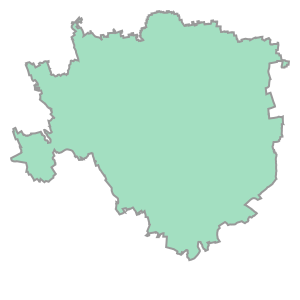

In [ ]:
comune = gpd_dataframes['comune.json']
milano = comune[comune["COMUNE"] == "Milano"].geometry.iloc[0]
milano

In [ ]:
comune.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
def gdf_merge(gdfs):
  gdf_ref = gdfs[0]
  return pd.concat(
    [gdf.to_crs(gdf_ref.crs) for gdf in gdfs],
    ignore_index=True,
  )

In [ ]:
def gplot_milano(gdf, column = "dataset", **kwargs):
  if (type(gdf) is list):
    return gplot_milano(gdf_merge(gdf), column = column, **kwargs)
  plot_gdf = gpd.GeoDataFrame(
    pd.concat([
      comune[comune["COMUNE"] == "Milano"],
      gdf.to_crs(comune.crs),
    ], ignore_index=True),
    crs=comune.crs,
  )
  return plot_gdf.plot(column = column, **kwargs)

In [ ]:
# Genera punti per milano

def frange(start, stop, step):
    res, n = start, 1
    while res < stop:
        yield res
        res = start + n * step
        n += 1

def grid_points_in_polygon(polygon, width = None, height = None, distance = None):
    min_x, min_y, max_x, max_y = polygon.bounds
    widths = []
    heights = []
    if distance is not None:
      widths = list(frange(min_x, max_x, distance))
      heights = list(frange(min_y, max_y, distance))
    else:
      widths = list(frange(min_x, max_x, (max_x-min_x) / width))
      heights = list(frange(min_y, max_y, (max_y-min_y) / height))
    points = []
    for i in widths:
      for j in heights:
        p = Point(i, j)
        if polygon.contains(p):
            points.append(p)
    return points

In [ ]:
# Funzione per generare punti casuali all'interno di un poligono
def random_points_in_polygon(polygon, num_points):
    min_x, min_y, max_x, max_y = polygon.bounds
    points = []
    while len(points) < num_points:
        random_point = Point(random.uniform(min_x, max_x), random.uniform(min_y, max_y))
        if polygon.contains(random_point):
            points.append(random_point)
    return points

# Funzione per generare punti casuali lungo una linea
def random_points_in_linestring(linestring, num_points):
    points = []
    total_length = linestring.length
    for _ in range(num_points):
        random_distance = random.uniform(0, total_length)
        point = linestring.interpolate(random_distance)
        points.append(point)
    return points

# Funzione per generare punti in base all'area dei poligoni
def generate_points(df, points_per_sqm=1/15, points_per_meter=1/15):
    points = []
    indices = []

    for idx, row in df.iterrows():
        if row['geometry'].geom_type == 'Polygon':
            area_sqm = row['geometry'].area # * 1e6  # Convertire km^2 in m^2
            num_points = max(int(area_sqm * points_per_sqm), 1)
            points.extend(random_points_in_polygon(row['geometry'], num_points))
            indices.extend([idx] * num_points)
        elif row['geometry'].geom_type == 'MultiPolygon':
            for polygon in row['geometry'].geoms:
                area_sqm = polygon.area # * 1e6  # Convertire km^2 in m^2
                num_points = max(int(area_sqm * points_per_sqm), 1)
                points.extend(random_points_in_polygon(polygon, num_points))
                indices.extend([idx] * num_points)
        elif row['geometry'].geom_type == 'LineString':
            length_m = row['geometry'].length # * 1000  # Convertire km in m
            num_points = max(int(length_m * points_per_meter), 1)
            points.extend(random_points_in_linestring(row['geometry'], num_points))
            indices.extend([idx] * num_points)
        elif row['geometry'].geom_type == 'MultiLineString':
            for linestring in row['geometry'].geoms:
                length_m = linestring.length # * 1000  # Convertire km in m
                num_points = max(int(length_m * points_per_meter), 1)
                points.extend(random_points_in_linestring(linestring, num_points))
                indices.extend([idx] * num_points)
        elif row['geometry'].geom_type == 'Point':
            points.append(row['geometry'])
            indices.append(idx)
        else:
            print(f"warning: geometry type {row['geometry'].geom_type} not handled")

    return points, indices

In [ ]:
def sum_per_ring(X):
  X["buildings_100"] = X["buildings_100.0-1"] + X["buildings_100.0-2"] + X["buildings_100.0-3"] + X["buildings_100.0-4"] +\
                      X["buildings_100.0-5"] + X["buildings_100.0-6"] + X["buildings_100.0-7"] + X["buildings_100.0-8"]
  X["buildings_200"] = X["buildings_200.0-1"] + X["buildings_200.0-2"] + X["buildings_200.0-3"] + X["buildings_200.0-4"] +\
                      X["buildings_200.0-5"] + X["buildings_200.0-6"] + X["buildings_200.0-7"] + X["buildings_200.0-8"]
  X["buildings_500"] = X["buildings_500.0-1"] + X["buildings_500.0-2"] + X["buildings_500.0-3"] + X["buildings_500.0-4"] +\
                      X["buildings_500.0-5"] + X["buildings_500.0-6"] + X["buildings_500.0-7"] + X["buildings_500.0-8"]
  X["buildings_1000"] = X["buildings_1000.0-1"] + X["buildings_1000.0-2"] + X["buildings_1000.0-3"] + X["buildings_1000.0-4"] +\
                        X["buildings_1000.0-5"] + X["buildings_1000.0-6"] + X["buildings_1000.0-7"] + X["buildings_1000.0-8"]
  X["buildings_2000"] = X["buildings_2000.0-1"] + X["buildings_2000.0-2"] + X["buildings_2000.0-3"] + X["buildings_2000.0-4"] +\
                        X["buildings_2000.0-5"] + X["buildings_2000.0-6"] + X["buildings_2000.0-7"] + X["buildings_2000.0-8"]
  # X["buildings_1"] = X["buildings_100.0-1"] + X["buildings_200.0-1"] + X["buildings_500.0-1"] + X["buildings_1000.0-1"] + X["buildings_2000.0-1"]
  # X["buildings_2"] = X["buildings_100.0-2"] + X["buildings_200.0-2"] + X["buildings_500.0-2"] + X["buildings_1000.0-2"] + X["buildings_2000.0-2"]
  # X["buildings_3"] = X["buildings_100.0-3"] + X["buildings_200.0-3"] + X["buildings_500.0-3"] + X["buildings_1000.0-3"] + X["buildings_2000.0-3"]
  # X["buildings_4"] = X["buildings_100.0-4"] + X["buildings_200.0-4"] + X["buildings_500.0-4"] + X["buildings_1000.0-4"] + X["buildings_2000.0-4"]
  # X["buildings_5"] = X["buildings_100.0-5"] + X["buildings_200.0-5"] + X["buildings_500.0-5"] + X["buildings_1000.0-5"] + X["buildings_2000.0-5"]
  # X["buildings_6"] = X["buildings_100.0-6"] + X["buildings_200.0-6"] + X["buildings_500.0-6"] + X["buildings_1000.0-6"] + X["buildings_2000.0-6"]
  # X["buildings_7"] = X["buildings_100.0-7"] + X["buildings_200.0-7"] + X["buildings_500.0-7"] + X["buildings_1000.0-7"] + X["buildings_2000.0-7"]
  # X["buildings_8"] = X["buildings_100.0-8"] + X["buildings_200.0-8"] + X["buildings_500.0-8"] + X["buildings_1000.0-8"] + X["buildings_2000.0-8"]
  del X["buildings_100.0-1"]
  del X["buildings_200.0-1"]
  del X["buildings_500.0-1"]
  del X["buildings_1000.0-1"]
  del X["buildings_2000.0-1"]
  del X["buildings_100.0-2"]
  del X["buildings_200.0-2"]
  del X["buildings_500.0-2"]
  del X["buildings_1000.0-2"]
  del X["buildings_2000.0-2"]
  del X["buildings_100.0-3"]
  del X["buildings_200.0-3"]
  del X["buildings_500.0-3"]
  del X["buildings_1000.0-3"]
  del X["buildings_2000.0-3"]
  del X["buildings_100.0-4"]
  del X["buildings_200.0-4"]
  del X["buildings_500.0-4"]
  del X["buildings_1000.0-4"]
  del X["buildings_2000.0-4"]
  del X["buildings_100.0-5"]
  del X["buildings_200.0-5"]
  del X["buildings_500.0-5"]
  del X["buildings_1000.0-5"]
  del X["buildings_2000.0-5"]
  del X["buildings_100.0-6"]
  del X["buildings_200.0-6"]
  del X["buildings_500.0-6"]
  del X["buildings_1000.0-6"]
  del X["buildings_2000.0-6"]
  del X["buildings_100.0-7"]
  del X["buildings_200.0-7"]
  del X["buildings_500.0-7"]
  del X["buildings_1000.0-7"]
  del X["buildings_2000.0-7"]
  del X["buildings_100.0-8"]
  del X["buildings_200.0-8"]
  del X["buildings_500.0-8"]
  del X["buildings_1000.0-8"]
  del X["buildings_2000.0-8"]
  X["green_tree-100"] = X["green_tree-100.0-1"] + X["green_tree-100.0-2"] + X["green_tree-100.0-3"] + X["green_tree-100.0-4"] +\
                      X["green_tree-100.0-5"] + X["green_tree-100.0-6"] + X["green_tree-100.0-7"] + X["green_tree-100.0-8"]
  X["green_tree-200"] = X["green_tree-200.0-1"] + X["green_tree-200.0-2"] + X["green_tree-200.0-3"] + X["green_tree-200.0-4"] +\
                      X["green_tree-200.0-5"] + X["green_tree-200.0-6"] + X["green_tree-200.0-7"] + X["green_tree-200.0-8"]
  X["green_tree-500"] = X["green_tree-500.0-1"] + X["green_tree-500.0-2"] + X["green_tree-500.0-3"] + X["green_tree-500.0-4"] +\
                      X["green_tree-500.0-5"] + X["green_tree-500.0-6"] + X["green_tree-500.0-7"] + X["green_tree-500.0-8"]
  X["green_tree-1000"] = X["green_tree-1000.0-1"] + X["green_tree-1000.0-2"] + X["green_tree-1000.0-3"] + X["green_tree-1000.0-4"] +\
                        X["green_tree-1000.0-5"] + X["green_tree-1000.0-6"] + X["green_tree-1000.0-7"] + X["green_tree-1000.0-8"]
  X["green_tree-2000"] = X["green_tree-2000.0-1"] + X["green_tree-2000.0-2"] + X["green_tree-2000.0-3"] + X["green_tree-2000.0-4"] +\
                        X["green_tree-2000.0-5"] + X["green_tree-2000.0-6"] + X["green_tree-2000.0-7"] + X["green_tree-2000.0-8"]
  del X["green_tree-100.0-1"]
  del X["green_tree-200.0-1"]
  del X["green_tree-500.0-1"]
  del X["green_tree-1000.0-1"]
  del X["green_tree-2000.0-1"]
  del X["green_tree-100.0-2"]
  del X["green_tree-200.0-2"]
  del X["green_tree-500.0-2"]
  del X["green_tree-1000.0-2"]
  del X["green_tree-2000.0-2"]
  del X["green_tree-100.0-3"]
  del X["green_tree-200.0-3"]
  del X["green_tree-500.0-3"]
  del X["green_tree-1000.0-3"]
  del X["green_tree-2000.0-3"]
  del X["green_tree-100.0-4"]
  del X["green_tree-200.0-4"]
  del X["green_tree-500.0-4"]
  del X["green_tree-1000.0-4"]
  del X["green_tree-2000.0-4"]
  del X["green_tree-100.0-5"]
  del X["green_tree-200.0-5"]
  del X["green_tree-500.0-5"]
  del X["green_tree-1000.0-5"]
  del X["green_tree-2000.0-5"]
  del X["green_tree-100.0-6"]
  del X["green_tree-200.0-6"]
  del X["green_tree-500.0-6"]
  del X["green_tree-1000.0-6"]
  del X["green_tree-2000.0-6"]
  del X["green_tree-100.0-7"]
  del X["green_tree-200.0-7"]
  del X["green_tree-500.0-7"]
  del X["green_tree-1000.0-7"]
  del X["green_tree-2000.0-7"]
  del X["green_tree-100.0-8"]
  del X["green_tree-200.0-8"]
  del X["green_tree-500.0-8"]
  del X["green_tree-1000.0-8"]
  del X["green_tree-2000.0-8"]
  X["green_shrub-100"] = X["green_shrub-100.0-1"] + X["green_shrub-100.0-2"] + X["green_shrub-100.0-3"] + X["green_shrub-100.0-4"] +\
                      X["green_shrub-100.0-5"] + X["green_shrub-100.0-6"] + X["green_shrub-100.0-7"] + X["green_shrub-100.0-8"]
  X["green_shrub-200"] = X["green_shrub-200.0-1"] + X["green_shrub-200.0-2"] + X["green_shrub-200.0-3"] + X["green_shrub-200.0-4"] +\
                      X["green_shrub-200.0-5"] + X["green_shrub-200.0-6"] + X["green_shrub-200.0-7"] + X["green_shrub-200.0-8"]
  X["green_shrub-500"] = X["green_shrub-500.0-1"] + X["green_shrub-500.0-2"] + X["green_shrub-500.0-3"] + X["green_shrub-500.0-4"] +\
                      X["green_shrub-500.0-5"] + X["green_shrub-500.0-6"] + X["green_shrub-500.0-7"] + X["green_shrub-500.0-8"]
  X["green_shrub-1000"] = X["green_shrub-1000.0-1"] + X["green_shrub-1000.0-2"] + X["green_shrub-1000.0-3"] + X["green_shrub-1000.0-4"] +\
                        X["green_shrub-1000.0-5"] + X["green_shrub-1000.0-6"] + X["green_shrub-1000.0-7"] + X["green_shrub-1000.0-8"]
  X["green_shrub-2000"] = X["green_shrub-2000.0-1"] + X["green_shrub-2000.0-2"] + X["green_shrub-2000.0-3"] + X["green_shrub-2000.0-4"] +\
                        X["green_shrub-2000.0-5"] + X["green_shrub-2000.0-6"] + X["green_shrub-2000.0-7"] + X["green_shrub-2000.0-8"]
  del X["green_shrub-100.0-1"]
  del X["green_shrub-200.0-1"]
  del X["green_shrub-500.0-1"]
  del X["green_shrub-1000.0-1"]
  del X["green_shrub-2000.0-1"]
  del X["green_shrub-100.0-2"]
  del X["green_shrub-200.0-2"]
  del X["green_shrub-500.0-2"]
  del X["green_shrub-1000.0-2"]
  del X["green_shrub-2000.0-2"]
  del X["green_shrub-100.0-3"]
  del X["green_shrub-200.0-3"]
  del X["green_shrub-500.0-3"]
  del X["green_shrub-1000.0-3"]
  del X["green_shrub-2000.0-3"]
  del X["green_shrub-100.0-4"]
  del X["green_shrub-200.0-4"]
  del X["green_shrub-500.0-4"]
  del X["green_shrub-1000.0-4"]
  del X["green_shrub-2000.0-4"]
  del X["green_shrub-100.0-5"]
  del X["green_shrub-200.0-5"]
  del X["green_shrub-500.0-5"]
  del X["green_shrub-1000.0-5"]
  del X["green_shrub-2000.0-5"]
  del X["green_shrub-100.0-6"]
  del X["green_shrub-200.0-6"]
  del X["green_shrub-500.0-6"]
  del X["green_shrub-1000.0-6"]
  del X["green_shrub-2000.0-6"]
  del X["green_shrub-100.0-7"]
  del X["green_shrub-200.0-7"]
  del X["green_shrub-500.0-7"]
  del X["green_shrub-1000.0-7"]
  del X["green_shrub-2000.0-7"]
  del X["green_shrub-100.0-8"]
  del X["green_shrub-200.0-8"]
  del X["green_shrub-500.0-8"]
  del X["green_shrub-1000.0-8"]
  del X["green_shrub-2000.0-8"]
  X["green_grassland-100"] = X["green_grassland-100.0-1"] + X["green_grassland-100.0-2"] + X["green_grassland-100.0-3"] + X["green_grassland-100.0-4"] +\
                      X["green_grassland-100.0-5"] + X["green_grassland-100.0-6"] + X["green_grassland-100.0-7"] + X["green_grassland-100.0-8"]
  X["green_grassland-200"] = X["green_grassland-200.0-1"] + X["green_grassland-200.0-2"] + X["green_grassland-200.0-3"] + X["green_grassland-200.0-4"] +\
                      X["green_grassland-200.0-5"] + X["green_grassland-200.0-6"] + X["green_grassland-200.0-7"] + X["green_grassland-200.0-8"]
  X["green_grassland-500"] = X["green_grassland-500.0-1"] + X["green_grassland-500.0-2"] + X["green_grassland-500.0-3"] + X["green_grassland-500.0-4"] +\
                      X["green_grassland-500.0-5"] + X["green_grassland-500.0-6"] + X["green_grassland-500.0-7"] + X["green_grassland-500.0-8"]
  X["green_grassland-1000"] = X["green_grassland-1000.0-1"] + X["green_grassland-1000.0-2"] + X["green_grassland-1000.0-3"] + X["green_grassland-1000.0-4"] +\
                        X["green_grassland-1000.0-5"] + X["green_grassland-1000.0-6"] + X["green_grassland-1000.0-7"] + X["green_grassland-1000.0-8"]
  X["green_grassland-2000"] = X["green_grassland-2000.0-1"] + X["green_grassland-2000.0-2"] + X["green_grassland-2000.0-3"] + X["green_grassland-2000.0-4"] +\
                        X["green_grassland-2000.0-5"] + X["green_grassland-2000.0-6"] + X["green_grassland-2000.0-7"] + X["green_grassland-2000.0-8"]
  del X["green_grassland-100.0-1"]
  del X["green_grassland-200.0-1"]
  del X["green_grassland-500.0-1"]
  del X["green_grassland-1000.0-1"]
  del X["green_grassland-2000.0-1"]
  del X["green_grassland-100.0-2"]
  del X["green_grassland-200.0-2"]
  del X["green_grassland-500.0-2"]
  del X["green_grassland-1000.0-2"]
  del X["green_grassland-2000.0-2"]
  del X["green_grassland-100.0-3"]
  del X["green_grassland-200.0-3"]
  del X["green_grassland-500.0-3"]
  del X["green_grassland-1000.0-3"]
  del X["green_grassland-2000.0-3"]
  del X["green_grassland-100.0-4"]
  del X["green_grassland-200.0-4"]
  del X["green_grassland-500.0-4"]
  del X["green_grassland-1000.0-4"]
  del X["green_grassland-2000.0-4"]
  del X["green_grassland-100.0-5"]
  del X["green_grassland-200.0-5"]
  del X["green_grassland-500.0-5"]
  del X["green_grassland-1000.0-5"]
  del X["green_grassland-2000.0-5"]
  del X["green_grassland-100.0-6"]
  del X["green_grassland-200.0-6"]
  del X["green_grassland-500.0-6"]
  del X["green_grassland-1000.0-6"]
  del X["green_grassland-2000.0-6"]
  del X["green_grassland-100.0-7"]
  del X["green_grassland-200.0-7"]
  del X["green_grassland-500.0-7"]
  del X["green_grassland-1000.0-7"]
  del X["green_grassland-2000.0-7"]
  del X["green_grassland-100.0-8"]
  del X["green_grassland-200.0-8"]
  del X["green_grassland-500.0-8"]
  del X["green_grassland-1000.0-8"]
  del X["green_grassland-2000.0-8"]
  X["green_wood-100"] = X["green_wood-100.0-1"] + X["green_wood-100.0-2"] + X["green_wood-100.0-3"] + X["green_wood-100.0-4"] +\
                      X["green_wood-100.0-5"] + X["green_wood-100.0-6"] + X["green_wood-100.0-7"] + X["green_wood-100.0-8"]
  X["green_wood-200"] = X["green_wood-200.0-1"] + X["green_wood-200.0-2"] + X["green_wood-200.0-3"] + X["green_wood-200.0-4"] +\
                      X["green_wood-200.0-5"] + X["green_wood-200.0-6"] + X["green_wood-200.0-7"] + X["green_wood-200.0-8"]
  X["green_wood-500"] = X["green_wood-500.0-1"] + X["green_wood-500.0-2"] + X["green_wood-500.0-3"] + X["green_wood-500.0-4"] +\
                      X["green_wood-500.0-5"] + X["green_wood-500.0-6"] + X["green_wood-500.0-7"] + X["green_wood-500.0-8"]
  X["green_wood-1000"] = X["green_wood-1000.0-1"] + X["green_wood-1000.0-2"] + X["green_wood-1000.0-3"] + X["green_wood-1000.0-4"] +\
                        X["green_wood-1000.0-5"] + X["green_wood-1000.0-6"] + X["green_wood-1000.0-7"] + X["green_wood-1000.0-8"]
  X["green_wood-2000"] = X["green_wood-2000.0-1"] + X["green_wood-2000.0-2"] + X["green_wood-2000.0-3"] + X["green_wood-2000.0-4"] +\
                        X["green_wood-2000.0-5"] + X["green_wood-2000.0-6"] + X["green_wood-2000.0-7"] + X["green_wood-2000.0-8"]
  del X["green_wood-100.0-1"]
  del X["green_wood-200.0-1"]
  del X["green_wood-500.0-1"]
  del X["green_wood-1000.0-1"]
  del X["green_wood-2000.0-1"]
  del X["green_wood-100.0-2"]
  del X["green_wood-200.0-2"]
  del X["green_wood-500.0-2"]
  del X["green_wood-1000.0-2"]
  del X["green_wood-2000.0-2"]
  del X["green_wood-100.0-3"]
  del X["green_wood-200.0-3"]
  del X["green_wood-500.0-3"]
  del X["green_wood-1000.0-3"]
  del X["green_wood-2000.0-3"]
  del X["green_wood-100.0-4"]
  del X["green_wood-200.0-4"]
  del X["green_wood-500.0-4"]
  del X["green_wood-1000.0-4"]
  del X["green_wood-2000.0-4"]
  del X["green_wood-100.0-5"]
  del X["green_wood-200.0-5"]
  del X["green_wood-500.0-5"]
  del X["green_wood-1000.0-5"]
  del X["green_wood-2000.0-5"]
  del X["green_wood-100.0-6"]
  del X["green_wood-200.0-6"]
  del X["green_wood-500.0-6"]
  del X["green_wood-1000.0-6"]
  del X["green_wood-2000.0-6"]
  del X["green_wood-100.0-7"]
  del X["green_wood-200.0-7"]
  del X["green_wood-500.0-7"]
  del X["green_wood-1000.0-7"]
  del X["green_wood-2000.0-7"]
  del X["green_wood-100.0-8"]
  del X["green_wood-200.0-8"]
  del X["green_wood-500.0-8"]
  del X["green_wood-1000.0-8"]
  del X["green_wood-2000.0-8"]
  X["green_tree_row-100"] = X["green_tree_row-100.0-1"] + X["green_tree_row-100.0-2"] + X["green_tree_row-100.0-3"] + X["green_tree_row-100.0-4"] +\
                      X["green_tree_row-100.0-5"] + X["green_tree_row-100.0-6"] + X["green_tree_row-100.0-7"] + X["green_tree_row-100.0-8"]
  X["green_tree_row-200"] = X["green_tree_row-200.0-1"] + X["green_tree_row-200.0-2"] + X["green_tree_row-200.0-3"] + X["green_tree_row-200.0-4"] +\
                      X["green_tree_row-200.0-5"] + X["green_tree_row-200.0-6"] + X["green_tree_row-200.0-7"] + X["green_tree_row-200.0-8"]
  X["green_tree_row-500"] = X["green_tree_row-500.0-1"] + X["green_tree_row-500.0-2"] + X["green_tree_row-500.0-3"] + X["green_tree_row-500.0-4"] +\
                      X["green_tree_row-500.0-5"] + X["green_tree_row-500.0-6"] + X["green_tree_row-500.0-7"] + X["green_tree_row-500.0-8"]
  X["green_tree_row-1000"] = X["green_tree_row-1000.0-1"] + X["green_tree_row-1000.0-2"] + X["green_tree_row-1000.0-3"] + X["green_tree_row-1000.0-4"] +\
                        X["green_tree_row-1000.0-5"] + X["green_tree_row-1000.0-6"] + X["green_tree_row-1000.0-7"] + X["green_tree_row-1000.0-8"]
  X["green_tree_row-2000"] = X["green_tree_row-2000.0-1"] + X["green_tree_row-2000.0-2"] + X["green_tree_row-2000.0-3"] + X["green_tree_row-2000.0-4"] +\
                        X["green_tree_row-2000.0-5"] + X["green_tree_row-2000.0-6"] + X["green_tree_row-2000.0-7"] + X["green_tree_row-2000.0-8"]
  del X["green_tree_row-100.0-1"]
  del X["green_tree_row-200.0-1"]
  del X["green_tree_row-500.0-1"]
  del X["green_tree_row-1000.0-1"]
  del X["green_tree_row-2000.0-1"]
  del X["green_tree_row-100.0-2"]
  del X["green_tree_row-200.0-2"]
  del X["green_tree_row-500.0-2"]
  del X["green_tree_row-1000.0-2"]
  del X["green_tree_row-2000.0-2"]
  del X["green_tree_row-100.0-3"]
  del X["green_tree_row-200.0-3"]
  del X["green_tree_row-500.0-3"]
  del X["green_tree_row-1000.0-3"]
  del X["green_tree_row-2000.0-3"]
  del X["green_tree_row-100.0-4"]
  del X["green_tree_row-200.0-4"]
  del X["green_tree_row-500.0-4"]
  del X["green_tree_row-1000.0-4"]
  del X["green_tree_row-2000.0-4"]
  del X["green_tree_row-100.0-5"]
  del X["green_tree_row-200.0-5"]
  del X["green_tree_row-500.0-5"]
  del X["green_tree_row-1000.0-5"]
  del X["green_tree_row-2000.0-5"]
  del X["green_tree_row-100.0-6"]
  del X["green_tree_row-200.0-6"]
  del X["green_tree_row-500.0-6"]
  del X["green_tree_row-1000.0-6"]
  del X["green_tree_row-2000.0-6"]
  del X["green_tree_row-100.0-7"]
  del X["green_tree_row-200.0-7"]
  del X["green_tree_row-500.0-7"]
  del X["green_tree_row-1000.0-7"]
  del X["green_tree_row-2000.0-7"]
  del X["green_tree_row-100.0-8"]
  del X["green_tree_row-200.0-8"]
  del X["green_tree_row-500.0-8"]
  del X["green_tree_row-1000.0-8"]
  del X["green_tree_row-2000.0-8"]
  X["green_forest-100"] = X["green_forest-100.0-1"] + X["green_forest-100.0-2"] + X["green_forest-100.0-3"] + X["green_forest-100.0-4"] +\
                      X["green_forest-100.0-5"] + X["green_forest-100.0-6"] + X["green_forest-100.0-7"] + X["green_forest-100.0-8"]
  X["green_forest-200"] = X["green_forest-200.0-1"] + X["green_forest-200.0-2"] + X["green_forest-200.0-3"] + X["green_forest-200.0-4"] +\
                      X["green_forest-200.0-5"] + X["green_forest-200.0-6"] + X["green_forest-200.0-7"] + X["green_forest-200.0-8"]
  X["green_forest-500"] = X["green_forest-500.0-1"] + X["green_forest-500.0-2"] + X["green_forest-500.0-3"] + X["green_forest-500.0-4"] +\
                      X["green_forest-500.0-5"] + X["green_forest-500.0-6"] + X["green_forest-500.0-7"] + X["green_forest-500.0-8"]
  X["green_forest-1000"] = X["green_forest-1000.0-1"] + X["green_forest-1000.0-2"] + X["green_forest-1000.0-3"] + X["green_forest-1000.0-4"] +\
                        X["green_forest-1000.0-5"] + X["green_forest-1000.0-6"] + X["green_forest-1000.0-7"] + X["green_forest-1000.0-8"]
  X["green_forest-2000"] = X["green_forest-2000.0-1"] + X["green_forest-2000.0-2"] + X["green_forest-2000.0-3"] + X["green_forest-2000.0-4"] +\
                        X["green_forest-2000.0-5"] + X["green_forest-2000.0-6"] + X["green_forest-2000.0-7"] + X["green_forest-2000.0-8"]
  del X["green_forest-100.0-1"]
  del X["green_forest-200.0-1"]
  del X["green_forest-500.0-1"]
  del X["green_forest-1000.0-1"]
  del X["green_forest-2000.0-1"]
  del X["green_forest-100.0-2"]
  del X["green_forest-200.0-2"]
  del X["green_forest-500.0-2"]
  del X["green_forest-1000.0-2"]
  del X["green_forest-2000.0-2"]
  del X["green_forest-100.0-3"]
  del X["green_forest-200.0-3"]
  del X["green_forest-500.0-3"]
  del X["green_forest-1000.0-3"]
  del X["green_forest-2000.0-3"]
  del X["green_forest-100.0-4"]
  del X["green_forest-200.0-4"]
  del X["green_forest-500.0-4"]
  del X["green_forest-1000.0-4"]
  del X["green_forest-2000.0-4"]
  del X["green_forest-100.0-5"]
  del X["green_forest-200.0-5"]
  del X["green_forest-500.0-5"]
  del X["green_forest-1000.0-5"]
  del X["green_forest-2000.0-5"]
  del X["green_forest-100.0-6"]
  del X["green_forest-200.0-6"]
  del X["green_forest-500.0-6"]
  del X["green_forest-1000.0-6"]
  del X["green_forest-2000.0-6"]
  del X["green_forest-100.0-7"]
  del X["green_forest-200.0-7"]
  del X["green_forest-500.0-7"]
  del X["green_forest-1000.0-7"]
  del X["green_forest-2000.0-7"]
  del X["green_forest-100.0-8"]
  del X["green_forest-200.0-8"]
  del X["green_forest-500.0-8"]
  del X["green_forest-1000.0-8"]
  del X["green_forest-2000.0-8"]
  X["green_wetland-100"] = X["green_wetland-100.0-1"] + X["green_wetland-100.0-2"] + X["green_wetland-100.0-3"] + X["green_wetland-100.0-4"] +\
                      X["green_wetland-100.0-5"] + X["green_wetland-100.0-6"] + X["green_wetland-100.0-7"] + X["green_wetland-100.0-8"]
  X["green_wetland-200"] = X["green_wetland-200.0-1"] + X["green_wetland-200.0-2"] + X["green_wetland-200.0-3"] + X["green_wetland-200.0-4"] +\
                      X["green_wetland-200.0-5"] + X["green_wetland-200.0-6"] + X["green_wetland-200.0-7"] + X["green_wetland-200.0-8"]
  X["green_wetland-500"] = X["green_wetland-500.0-1"] + X["green_wetland-500.0-2"] + X["green_wetland-500.0-3"] + X["green_wetland-500.0-4"] +\
                      X["green_wetland-500.0-5"] + X["green_wetland-500.0-6"] + X["green_wetland-500.0-7"] + X["green_wetland-500.0-8"]
  X["green_wetland-1000"] = X["green_wetland-1000.0-1"] + X["green_wetland-1000.0-2"] + X["green_wetland-1000.0-3"] + X["green_wetland-1000.0-4"] +\
                        X["green_wetland-1000.0-5"] + X["green_wetland-1000.0-6"] + X["green_wetland-1000.0-7"] + X["green_wetland-1000.0-8"]
  X["green_wetland-2000"] = X["green_wetland-2000.0-1"] + X["green_wetland-2000.0-2"] + X["green_wetland-2000.0-3"] + X["green_wetland-2000.0-4"] +\
                        X["green_wetland-2000.0-5"] + X["green_wetland-2000.0-6"] + X["green_wetland-2000.0-7"] + X["green_wetland-2000.0-8"]
  del X["green_wetland-100.0-1"]
  del X["green_wetland-200.0-1"]
  del X["green_wetland-500.0-1"]
  del X["green_wetland-1000.0-1"]
  del X["green_wetland-2000.0-1"]
  del X["green_wetland-100.0-2"]
  del X["green_wetland-200.0-2"]
  del X["green_wetland-500.0-2"]
  del X["green_wetland-1000.0-2"]
  del X["green_wetland-2000.0-2"]
  del X["green_wetland-100.0-3"]
  del X["green_wetland-200.0-3"]
  del X["green_wetland-500.0-3"]
  del X["green_wetland-1000.0-3"]
  del X["green_wetland-2000.0-3"]
  del X["green_wetland-100.0-4"]
  del X["green_wetland-200.0-4"]
  del X["green_wetland-500.0-4"]
  del X["green_wetland-1000.0-4"]
  del X["green_wetland-2000.0-4"]
  del X["green_wetland-100.0-5"]
  del X["green_wetland-200.0-5"]
  del X["green_wetland-500.0-5"]
  del X["green_wetland-1000.0-5"]
  del X["green_wetland-2000.0-5"]
  del X["green_wetland-100.0-6"]
  del X["green_wetland-200.0-6"]
  del X["green_wetland-500.0-6"]
  del X["green_wetland-1000.0-6"]
  del X["green_wetland-2000.0-6"]
  del X["green_wetland-100.0-7"]
  del X["green_wetland-200.0-7"]
  del X["green_wetland-500.0-7"]
  del X["green_wetland-1000.0-7"]
  del X["green_wetland-2000.0-7"]
  del X["green_wetland-100.0-8"]
  del X["green_wetland-200.0-8"]
  del X["green_wetland-500.0-8"]
  del X["green_wetland-1000.0-8"]
  del X["green_wetland-2000.0-8"]
  X["green_scrub-100"] = X["green_scrub-100.0-1"] + X["green_scrub-100.0-2"] + X["green_scrub-100.0-3"] + X["green_scrub-100.0-4"] +\
                      X["green_scrub-100.0-5"] + X["green_scrub-100.0-6"] + X["green_scrub-100.0-7"] + X["green_scrub-100.0-8"]
  X["green_scrub-200"] = X["green_scrub-200.0-1"] + X["green_scrub-200.0-2"] + X["green_scrub-200.0-3"] + X["green_scrub-200.0-4"] +\
                      X["green_scrub-200.0-5"] + X["green_scrub-200.0-6"] + X["green_scrub-200.0-7"] + X["green_scrub-200.0-8"]
  X["green_scrub-500"] = X["green_scrub-500.0-1"] + X["green_scrub-500.0-2"] + X["green_scrub-500.0-3"] + X["green_scrub-500.0-4"] +\
                      X["green_scrub-500.0-5"] + X["green_scrub-500.0-6"] + X["green_scrub-500.0-7"] + X["green_scrub-500.0-8"]
  X["green_scrub-1000"] = X["green_scrub-1000.0-1"] + X["green_scrub-1000.0-2"] + X["green_scrub-1000.0-3"] + X["green_scrub-1000.0-4"] +\
                        X["green_scrub-1000.0-5"] + X["green_scrub-1000.0-6"] + X["green_scrub-1000.0-7"] + X["green_scrub-1000.0-8"]
  X["green_scrub-2000"] = X["green_scrub-2000.0-1"] + X["green_scrub-2000.0-2"] + X["green_scrub-2000.0-3"] + X["green_scrub-2000.0-4"] +\
                        X["green_scrub-2000.0-5"] + X["green_scrub-2000.0-6"] + X["green_scrub-2000.0-7"] + X["green_scrub-2000.0-8"]
  del X["green_scrub-100.0-1"]
  del X["green_scrub-200.0-1"]
  del X["green_scrub-500.0-1"]
  del X["green_scrub-1000.0-1"]
  del X["green_scrub-2000.0-1"]
  del X["green_scrub-100.0-2"]
  del X["green_scrub-200.0-2"]
  del X["green_scrub-500.0-2"]
  del X["green_scrub-1000.0-2"]
  del X["green_scrub-2000.0-2"]
  del X["green_scrub-100.0-3"]
  del X["green_scrub-200.0-3"]
  del X["green_scrub-500.0-3"]
  del X["green_scrub-1000.0-3"]
  del X["green_scrub-2000.0-3"]
  del X["green_scrub-100.0-4"]
  del X["green_scrub-200.0-4"]
  del X["green_scrub-500.0-4"]
  del X["green_scrub-1000.0-4"]
  del X["green_scrub-2000.0-4"]
  del X["green_scrub-100.0-5"]
  del X["green_scrub-200.0-5"]
  del X["green_scrub-500.0-5"]
  del X["green_scrub-1000.0-5"]
  del X["green_scrub-2000.0-5"]
  del X["green_scrub-100.0-6"]
  del X["green_scrub-200.0-6"]
  del X["green_scrub-500.0-6"]
  del X["green_scrub-1000.0-6"]
  del X["green_scrub-2000.0-6"]
  del X["green_scrub-100.0-7"]
  del X["green_scrub-200.0-7"]
  del X["green_scrub-500.0-7"]
  del X["green_scrub-1000.0-7"]
  del X["green_scrub-2000.0-7"]
  del X["green_scrub-100.0-8"]
  del X["green_scrub-200.0-8"]
  del X["green_scrub-500.0-8"]
  del X["green_scrub-1000.0-8"]
  del X["green_scrub-2000.0-8"]
  X["green_tree_group-100"] = X["green_tree_group-100.0-1"] + X["green_tree_group-100.0-2"] + X["green_tree_group-100.0-3"] + X["green_tree_group-100.0-4"] +\
                      X["green_tree_group-100.0-5"] + X["green_tree_group-100.0-6"] + X["green_tree_group-100.0-7"] + X["green_tree_group-100.0-8"]
  X["green_tree_group-200"] = X["green_tree_group-200.0-1"] + X["green_tree_group-200.0-2"] + X["green_tree_group-200.0-3"] + X["green_tree_group-200.0-4"] +\
                      X["green_tree_group-200.0-5"] + X["green_tree_group-200.0-6"] + X["green_tree_group-200.0-7"] + X["green_tree_group-200.0-8"]
  X["green_tree_group-500"] = X["green_tree_group-500.0-1"] + X["green_tree_group-500.0-2"] + X["green_tree_group-500.0-3"] + X["green_tree_group-500.0-4"] +\
                      X["green_tree_group-500.0-5"] + X["green_tree_group-500.0-6"] + X["green_tree_group-500.0-7"] + X["green_tree_group-500.0-8"]
  X["green_tree_group-1000"] = X["green_tree_group-1000.0-1"] + X["green_tree_group-1000.0-2"] + X["green_tree_group-1000.0-3"] + X["green_tree_group-1000.0-4"] +\
                        X["green_tree_group-1000.0-5"] + X["green_tree_group-1000.0-6"] + X["green_tree_group-1000.0-7"] + X["green_tree_group-1000.0-8"]
  X["green_tree_group-2000"] = X["green_tree_group-2000.0-1"] + X["green_tree_group-2000.0-2"] + X["green_tree_group-2000.0-3"] + X["green_tree_group-2000.0-4"] +\
                        X["green_tree_group-2000.0-5"] + X["green_tree_group-2000.0-6"] + X["green_tree_group-2000.0-7"] + X["green_tree_group-2000.0-8"]
  del X["green_tree_group-100.0-1"]
  del X["green_tree_group-200.0-1"]
  del X["green_tree_group-500.0-1"]
  del X["green_tree_group-1000.0-1"]
  del X["green_tree_group-2000.0-1"]
  del X["green_tree_group-100.0-2"]
  del X["green_tree_group-200.0-2"]
  del X["green_tree_group-500.0-2"]
  del X["green_tree_group-1000.0-2"]
  del X["green_tree_group-2000.0-2"]
  del X["green_tree_group-100.0-3"]
  del X["green_tree_group-200.0-3"]
  del X["green_tree_group-500.0-3"]
  del X["green_tree_group-1000.0-3"]
  del X["green_tree_group-2000.0-3"]
  del X["green_tree_group-100.0-4"]
  del X["green_tree_group-200.0-4"]
  del X["green_tree_group-500.0-4"]
  del X["green_tree_group-1000.0-4"]
  del X["green_tree_group-2000.0-4"]
  del X["green_tree_group-100.0-5"]
  del X["green_tree_group-200.0-5"]
  del X["green_tree_group-500.0-5"]
  del X["green_tree_group-1000.0-5"]
  del X["green_tree_group-2000.0-5"]
  del X["green_tree_group-100.0-6"]
  del X["green_tree_group-200.0-6"]
  del X["green_tree_group-500.0-6"]
  del X["green_tree_group-1000.0-6"]
  del X["green_tree_group-2000.0-6"]
  del X["green_tree_group-100.0-7"]
  del X["green_tree_group-200.0-7"]
  del X["green_tree_group-500.0-7"]
  del X["green_tree_group-1000.0-7"]
  del X["green_tree_group-2000.0-7"]
  del X["green_tree_group-100.0-8"]
  del X["green_tree_group-200.0-8"]
  del X["green_tree_group-500.0-8"]
  del X["green_tree_group-1000.0-8"]
  del X["green_tree_group-2000.0-8"]
  return X

# ML

## Data Preparation

### Air quality

In [ ]:
air_milano.head()

,stazione_id,month,C6H6,C6H6_measurements,CO_8h,CO_8h_measurements,NO2,NO2_measurements,O3,O3_measurements,PM10,PM10_measurements,"PM2,5","PM2,5_measurements",SO2,SO2_measurements
0,2,1,2.457143,21,NaN,0,57.142857,21,26.095238,21,33.238095,21,24.333333,21,3.619048,21
1,2,2,2.145000,20,NaN,0,69.400000,20,58.250000,20,47.850000,20,29.900000,20,4.550000,20
2,2,3,1.026087,23,NaN,0,62.217391,23,74.608696,23,29.173913,23,16.913043,23,3.739130,23
3,2,4,0.647059,17,NaN,0,42.000000,14,85.117647,17,18.588235,17,9.411765,17,4.308824,17
4,2,5,0.550000,22,NaN,0,32.904762,21,93.000000,22,14.772727,22,9.272727,22,2.886364,22


In [ ]:
air_sc.head()

,month,PM10,PM10_measurements,"PM2,5","PM2,5_measurements",sensor_id,sensor_type,location,lat,lon
0,1,30.730758,13490,20.968428,13490,44216,SDS011,29885,45.461683,9.182103
1,2,35.931124,13856,23.128715,13856,44216,SDS011,29885,45.461683,9.182103
2,3,20.303564,12872,14.347259,12872,44216,SDS011,29885,45.461683,9.182103
3,4,9.433302,6593,7.428934,6593,44216,SDS011,29885,45.461683,9.182103
4,5,9.086172,17712,7.302746,17712,44216,SDS011,29885,45.461683,9.182103


In [ ]:
air = pd.concat([
  air_milano[["stazione_id", "month", "PM10", "PM10_measurements", "PM2,5", "PM2,5_measurements"]].rename(columns={"stazione_id": "id"}),
  # drop lat and lon of sensor community, the ones guessed from the map manually are more precise
  air_sc[["sensor_id", "month", "PM10", "PM10_measurements", "PM2,5", "PM2,5_measurements"]].rename(columns={"sensor_id": "id"}),
])
# Drop rows where both PM10 and PM2,5 are NaN
air = air.dropna(subset=["PM10", "PM2,5"], how="all")
# Drop rows where any of PM10 and PM2,5 are NaN
air = air.dropna(subset=["PM10", "PM2,5"], how="any")
air

,id,month,PM10,PM10_measurements,"PM2,5","PM2,5_measurements"
0,2,1,33.238095,21,24.333333,21
1,2,2,47.850000,20,29.900000,20
2,2,3,29.173913,23,16.913043,23
3,2,4,18.588235,17,9.411765,17
4,2,5,14.772727,22,9.272727,22
5,2,6,19.050000,20,11.550000,20
6,2,7,20.277778,18,11.444444,18
7,2,8,17.500000,16,9.812500,16
8,2,9,23.809524,21,13.380952,21
9,2,10,31.954545,22,15.954545,22


In [ ]:
air = pd.get_dummies(air, columns=["month"])
air

,id,PM10,PM10_measurements,"PM2,5","PM2,5_measurements",month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2,33.238095,21,24.333333,21,True,False,False,False,False,False,False,False,False,False,False,False
1,2,47.850000,20,29.900000,20,False,True,False,False,False,False,False,False,False,False,False,False
2,2,29.173913,23,16.913043,23,False,False,True,False,False,False,False,False,False,False,False,False
3,2,18.588235,17,9.411765,17,False,False,False,True,False,False,False,False,False,False,False,False
4,2,14.772727,22,9.272727,22,False,False,False,False,True,False,False,False,False,False,False,False
5,2,19.050000,20,11.550000,20,False,False,False,False,False,True,False,False,False,False,False,False
6,2,20.277778,18,11.444444,18,False,False,False,False,False,False,True,False,False,False,False,False
7,2,17.500000,16,9.812500,16,False,False,False,False,False,False,False,True,False,False,False,False
8,2,23.809524,21,13.380952,21,False,False,False,False,False,False,False,False,True,False,False,False
9,2,31.954545,22,15.954545,22,False,False,False,False,False,False,False,False,False,True,False,False


In [ ]:
air.id.value_counts()

id
2        12
4        12
6        12
44216    12
70169    12
50128    12
32393    12
22851    12
24644    12
40256    11
32399    11
Name: count, dtype: int64

### Stations

In [ ]:
stations_milano.head()

,id,name,id_arpa,inizio_operativita,fine_operativita,inquinanti,dataset,entity,source,color,geometry
0,2,via Pascal *,100,1900-01-01,2099-12-31,"NO2, SO2, PM25, SO2, O3, PM10, C6H6",stations_milano,station,milano,blue,POINT (518351.042 5035645.702)
1,4,viale Marche,2,1900-01-01,2099-12-31,"C6H6, CO_8h, PM25, PM10, NO2",stations_milano,station,milano,blue,POINT (514910.677 5038103.127)
2,6,via Senato *,125,1900-01-01,2099-12-31,"PM25, PM10, C6H6, CO_8h, NO2",stations_milano,station,milano,blue,POINT (515470.916 5035238.303)
3,7,Verziere,85,1900-01-01,2099-12-31,"O3, PM10, NO2, CO_8h",stations_milano,station,milano,blue,POINT (515271.158 5034460.138)


In [ ]:
sc_stations.head()

,id,name,Latitude,Longitude,dataset,entity,source,color,geometry
0,44216,Centro,45.4617222,9.182333333333332,sc_chosen_stations,station_sc,sensor community,red,POINT (514254.769 5034260.134)
1,40256,Porta Vittoria,45.462109495758476,9.209781789416478,sc_chosen_stations,station_sc,sensor community,red,POINT (516400.569 5034308.395)
2,32399,Via Meda,45.43998127831078,9.178070145718733,sc_chosen_stations,station_sc,sensor community,red,POINT (513926.824 5031844.054)
3,70169,Lodi,45.442101399035224,9.21225714798778,sc_chosen_stations,station_sc,sensor community,red,POINT (516599.959 5032086.080)
4,50128,Piazza Leonardo,45.47777813047526,9.224090852257673,sc_chosen_stations,station_sc,sensor community,red,POINT (517514.386 5036052.144)


In [ ]:
sc_stations["id"] = pd.to_numeric(sc_stations["id"].str[1:])
sc_stations.head()

AttributeError: Can only use .str accessor with string values!

In [ ]:
stations = pd.concat([
  stations_milano[["id", "name", "geometry", "dataset"]],
  sc_stations[["id", "name", "geometry", "dataset"]],
])
stations

,id,name,geometry,dataset
0,2,via Pascal *,POINT (518351.042 5035645.702),stations_milano
1,4,viale Marche,POINT (514910.677 5038103.127),stations_milano
2,6,via Senato *,POINT (515470.916 5035238.303),stations_milano
3,7,Verziere,POINT (515271.158 5034460.138),stations_milano
0,44216,Centro,POINT (514254.769 5034260.134),sc_chosen_stations
1,40256,Porta Vittoria,POINT (516400.569 5034308.395),sc_chosen_stations
2,32399,Via Meda,POINT (513926.824 5031844.054),sc_chosen_stations
3,70169,Lodi,POINT (516599.959 5032086.080),sc_chosen_stations
4,50128,Piazza Leonardo,POINT (517514.386 5036052.144),sc_chosen_stations
5,32393,Via Ripamonti Fine,POINT (516145.039 5030310.204),sc_chosen_stations


In [ ]:
# with normalization
stations["x"] = (stations.geometry.x - stations.geometry.x.mean()) / stations.geometry.x.std()
stations["y"] = (stations.geometry.y - stations.geometry.y.mean()) / stations.geometry.y.std()
stations

,id,name,geometry,dataset,x,y
0,2,via Pascal *,POINT (518351.042 5035645.702),stations_milano,1.274562,0.430148
1,4,viale Marche,POINT (514910.677 5038103.127),stations_milano,-0.411245,1.434498
2,6,via Senato *,POINT (515470.916 5035238.303),stations_milano,-0.136723,0.263644
3,7,Verziere,POINT (515271.158 5034460.138),stations_milano,-0.234606,-0.054392
0,44216,Centro,POINT (514254.769 5034260.134),sc_chosen_stations,-0.732646,-0.136134
1,40256,Porta Vittoria,POINT (516400.569 5034308.395),sc_chosen_stations,0.318814,-0.116410
2,32399,Via Meda,POINT (513926.824 5031844.054),sc_chosen_stations,-0.893342,-1.123586
3,70169,Lodi,POINT (516599.959 5032086.080),sc_chosen_stations,0.416517,-1.024670
4,50128,Piazza Leonardo,POINT (517514.386 5036052.144),sc_chosen_stations,0.864594,0.596261
5,32393,Via Ripamonti Fine,POINT (516145.039 5030310.204),sc_chosen_stations,0.193603,-1.750471


In [ ]:
stations["stations_milano"] = stations["dataset"] == "stations_milano"
stations["stations_sc"] = stations["dataset"] == "sc_chosen_stations"
stations

,id,name,geometry,dataset,x,y,stations_milano,stations_sc
0,2,via Pascal *,POINT (518351.042 5035645.702),stations_milano,1.274562,0.430148,True,False
1,4,viale Marche,POINT (514910.677 5038103.127),stations_milano,-0.411245,1.434498,True,False
2,6,via Senato *,POINT (515470.916 5035238.303),stations_milano,-0.136723,0.263644,True,False
3,7,Verziere,POINT (515271.158 5034460.138),stations_milano,-0.234606,-0.054392,True,False
0,44216,Centro,POINT (514254.769 5034260.134),sc_chosen_stations,-0.732646,-0.136134,False,True
1,40256,Porta Vittoria,POINT (516400.569 5034308.395),sc_chosen_stations,0.318814,-0.116410,False,True
2,32399,Via Meda,POINT (513926.824 5031844.054),sc_chosen_stations,-0.893342,-1.123586,False,True
3,70169,Lodi,POINT (516599.959 5032086.080),sc_chosen_stations,0.416517,-1.024670,False,True
4,50128,Piazza Leonardo,POINT (517514.386 5036052.144),sc_chosen_stations,0.864594,0.596261,False,True
5,32393,Via Ripamonti Fine,POINT (516145.039 5030310.204),sc_chosen_stations,0.193603,-1.750471,False,True


### Areas

In [ ]:
# green_and_buildings_divided_in_areas = pd.merge(green_divided_in_areas, buildings_divided_in_areas, on=['stazione', 'raggio', 'settore'], how='outer')

In [ ]:
# green_and_buildings_divided_in_areas = green_and_buildings_divided_in_areas.fillna(0)
# green_and_buildings_divided_in_areas = green_and_buildings_divided_in_areas.astype({
#     'numero_alberi': int,
#     'numero_edifici': int
# })
# green_and_buildings_divided_in_areas

In [ ]:
# tm = divide_in_areas(stations[stations["name"] == "Piazza Leonardo"].to_crs(osm_milano_buildings.crs).geometry.iloc[0], osm_milano_buildings)
#tm = divide_in_areas(stations[stations["name"] == "Piazza Leonardo"].to_crs(crs=3857).geometry.iloc[0], osm_milano_buildings.to_crs(crs=3857))

In [ ]:
# https://gis.stackexchange.com/questions/218450/getting-polygon-areas-using-geopandas
# TODO change CRS
# tm["surface"] = tm.geometry.area * 10**6

In [ ]:
# tm = tm[tm["raggio"] != "inf"].groupby("area").agg({
#     "surface": "sum"
# })
# tm

In [ ]:
pd.set_option('display.max_rows', 10)

In [ ]:
#green_divided_in_areas.groupby("stazione").count()
buildings_divided_in_areas.groupby("area").count()

,stazione,geometry,distance,raggio,angolo,settore
area,,,,,,
100.0-1,125,125,125,125,125,125
100.0-2,236,236,236,236,236,236
100.0-3,277,277,277,277,277,277
100.0-4,337,337,337,337,337,337
100.0-5,181,181,181,181,181,181
...,...,...,...,...,...,...
inf-4,343453,343453,343453,343453,343453,343453
inf-5,296139,296139,296139,296139,296139,296139
inf-6,575685,575685,575685,575685,575685,575685


In [ ]:
buildings_divided_in_areas["stazione"]

0         44216
1         44216
2         44216
3         44216
4         44216
          ...  
432833      111
432834      111
432835      111
432836      111
432837      111
Name: stazione, Length: 5626894, dtype: int64

In [ ]:
buildings_divided_in_areas["stazione"] = buildings_divided_in_areas["stazione"].apply(lambda x: x[1:] if x.startswith('#') else x)
buildings_divided_in_areas["stazione"] = pd.to_numeric(buildings_divided_in_areas["stazione"])

AttributeError: 'int' object has no attribute 'startswith'

In [ ]:
buildings_divided_in_areas[buildings_divided_in_areas["stazione"] == 2]

,stazione,geometry,distance,raggio,angolo,settore,area
3462704,2,POINT (512229.779 5034988.595),6156.431577,inf,-96.127137,6,inf-6
3462705,2,POINT (512025.919 5034812.523),6379.763177,inf,-97.504106,6,inf-6
3462706,2,POINT (512045.843 5034195.149),6469.902834,inf,-102.955849,6,inf-6
3462707,2,POINT (512217.325 5034371.292),6264.711420,inf,-101.737425,6,inf-6
3462708,2,POINT (515892.385 5036926.663),2772.337627,inf,-62.480484,7,inf-7
...,...,...,...,...,...,...,...
3895537,2,POINT (513809.754 5036581.185),4636.640143,inf,-78.360171,7,inf-7
3895538,2,POINT (513828.776 5036580.516),4617.874558,inf,-78.320683,7,inf-7
3895539,2,POINT (513822.977 5036581.788),4623.811655,inf,-78.319794,7,inf-7
3895540,2,POINT (513821.438 5036592.315),4627.460059,inf,-78.196007,7,inf-7


In [ ]:
# green_divided_in_areas.groupby("stazione").count()
green_divided_in_areas.groupby("area").count()

,stazione,natural,geometry,distance,raggio,angolo,settore
area,,,,,,,
100.0-1,213,213,213,213,213,213,213
100.0-2,261,261,261,261,261,261,261
100.0-3,80,80,80,80,80,80,80
100.0-4,24,24,24,24,24,24,24
100.0-5,23,23,23,23,23,23,23
...,...,...,...,...,...,...,...
inf-4,474189,474189,474189,474189,474189,474189,474189
inf-5,220322,220322,220322,220322,220322,220322,220322
inf-6,273639,273639,273639,273639,273639,273639,273639


In [ ]:
green_divided_in_areas.groupby("stazione").count()

,natural,geometry,distance,raggio,angolo,settore,area
stazione,,,,,,,
2,788512,788512,788512,788512,788512,788512,788512
4,788512,788512,788512,788512,788512,788512,788512
6,788512,788512,788512,788512,788512,788512,788512
7,788512,788512,788512,788512,788512,788512,788512
22851,788512,788512,788512,788512,788512,788512,788512
24644,788512,788512,788512,788512,788512,788512,788512
32393,788512,788512,788512,788512,788512,788512,788512
32399,788512,788512,788512,788512,788512,788512,788512
40256,788512,788512,788512,788512,788512,788512,788512


In [ ]:
green_divided_in_areas["stazione"] = green_divided_in_areas["stazione"].apply(lambda x: x[1:] if x.startswith('#') else x)
green_divided_in_areas["stazione"] = pd.to_numeric(green_divided_in_areas["stazione"])

AttributeError: 'int' object has no attribute 'startswith'

In [ ]:
green_divided_in_areas[green_divided_in_areas["stazione"] == 7]

,stazione,natural,geometry,distance,raggio,angolo,settore,area
8673632,7,tree,POINT (515915.156 5034614.305),662.193908,1000.0,76.537318,2,1000.0-2
8673633,7,tree,POINT (512093.888 5031588.334),4282.791610,inf,-132.109128,6,inf-6
8673634,7,tree,POINT (512099.357 5031575.631),4287.272173,inf,-132.284089,6,inf-6
8673635,7,tree,POINT (511975.307 5031540.218),4403.245175,inf,-131.538952,6,inf-6
8673636,7,tree,POINT (512073.909 5031543.373),4327.807363,inf,-132.373363,6,inf-6
...,...,...,...,...,...,...,...,...
9462139,7,tree_group,POINT (513473.787 5032662.654),2541.946735,inf,-135.001791,5,inf-5
9462140,7,tree_group,POINT (513449.879 5032646.128),2570.543206,inf,-134.885435,6,inf-6
9462141,7,tree_group,POINT (513461.280 5032663.447),2550.246825,inf,-134.790508,6,inf-6
9462142,7,tree_group,POINT (513428.807 5032663.329),2573.476868,inf,-134.283011,6,inf-6


In [ ]:
from itertools import product
def all_areas():
    return [f"{r}.0-{s}" for r, s in product(raggi, settori)]
all_areas()

['100.0-1',
 '100.0-2',
 '100.0-3',
 '100.0-4',
 '100.0-5',
 '100.0-6',
 '100.0-7',
 '100.0-8',
 '200.0-1',
 '200.0-2',
 '200.0-3',
 '200.0-4',
 '200.0-5',
 '200.0-6',
 '200.0-7',
 '200.0-8',
 '500.0-1',
 '500.0-2',
 '500.0-3',
 '500.0-4',
 '500.0-5',
 '500.0-6',
 '500.0-7',
 '500.0-8',
 '1000.0-1',
 '1000.0-2',
 '1000.0-3',
 '1000.0-4',
 '1000.0-5',
 '1000.0-6',
 '1000.0-7',
 '1000.0-8',
 '2000.0-1',
 '2000.0-2',
 '2000.0-3',
 '2000.0-4',
 '2000.0-5',
 '2000.0-6',
 '2000.0-7',
 '2000.0-8']

In [ ]:
natural = list(green_divided_in_areas["natural"].unique())
natural

['tree',
 'shrub',
 'grassland',
 'wood',
 'tree_row',
 'forest',
 'wetland',
 'scrub',
 'tree_group']

In [ ]:
def all_natural_and_areas():
    return [f"{n}-{a}" for n, a in product(natural, all_areas())]
all_natural_and_areas()

['tree-100.0-1',
 'tree-100.0-2',
 'tree-100.0-3',
 'tree-100.0-4',
 'tree-100.0-5',
 'tree-100.0-6',
 'tree-100.0-7',
 'tree-100.0-8',
 'tree-200.0-1',
 'tree-200.0-2',
 'tree-200.0-3',
 'tree-200.0-4',
 'tree-200.0-5',
 'tree-200.0-6',
 'tree-200.0-7',
 'tree-200.0-8',
 'tree-500.0-1',
 'tree-500.0-2',
 'tree-500.0-3',
 'tree-500.0-4',
 'tree-500.0-5',
 'tree-500.0-6',
 'tree-500.0-7',
 'tree-500.0-8',
 'tree-1000.0-1',
 'tree-1000.0-2',
 'tree-1000.0-3',
 'tree-1000.0-4',
 'tree-1000.0-5',
 'tree-1000.0-6',
 'tree-1000.0-7',
 'tree-1000.0-8',
 'tree-2000.0-1',
 'tree-2000.0-2',
 'tree-2000.0-3',
 'tree-2000.0-4',
 'tree-2000.0-5',
 'tree-2000.0-6',
 'tree-2000.0-7',
 'tree-2000.0-8',
 'shrub-100.0-1',
 'shrub-100.0-2',
 'shrub-100.0-3',
 'shrub-100.0-4',
 'shrub-100.0-5',
 'shrub-100.0-6',
 'shrub-100.0-7',
 'shrub-100.0-8',
 'shrub-200.0-1',
 'shrub-200.0-2',
 'shrub-200.0-3',
 'shrub-200.0-4',
 'shrub-200.0-5',
 'shrub-200.0-6',
 'shrub-200.0-7',
 'shrub-200.0-8',
 'shrub-500.0-1'

In [ ]:
# tm = tm.reindex(all_areas(), fill_value=0)
# tm

In [ ]:
def augmentation_buildings(crs):
  def augmentation_buildings_apllyfunc(stations_df_row):
    tmp_station = gpd.GeoDataFrame(pd.DataFrame([stations_df_row]), geometry="geometry", crs=crs)
    tmp_station["id"] = pd.to_numeric(tmp_station["id"])
    tmp_buildings = buildings_divided_in_areas[buildings_divided_in_areas["stazione"] == tmp_station["id"].iloc[0]]
    tmp_buildings = tmp_buildings[tmp_buildings["raggio"] != "inf"]
    tmp_buildings = tmp_buildings.groupby("area")[["geometry"]].count()
    tmp_buildings = tmp_buildings.reindex(all_areas(), fill_value=0)
    return pd.Series([
        # geometry now is "count"
        tmp_buildings.loc[a]["geometry"] for a in all_areas()
    ])
  return augmentation_buildings_apllyfunc

In [ ]:
def augmentation_green(crs):
  def augmentation_green_apllyfunc(stations_df_row):
    tmp_station = gpd.GeoDataFrame(pd.DataFrame([stations_df_row]), geometry="geometry", crs=crs)
    tmp_station["id"] = pd.to_numeric(tmp_station["id"])
    tmp_green = green_divided_in_areas[green_divided_in_areas["stazione"] == tmp_station["id"].iloc[0]]
    tmp_green = tmp_green[tmp_green["raggio"] != "inf"]
    tmp_green["natural-and-area"] = "-"
    tmp_green["natural-and-area"] = tmp_green["natural"] + tmp_green["natural-and-area"] + tmp_green["area"]
    tmp_green = tmp_green.groupby(["natural-and-area"])[["geometry"]].count()
    tmp_green = tmp_green.reindex(all_natural_and_areas(), fill_value=0)
    return pd.Series([
        # geometry now is "count"
        tmp_green.loc[a]["geometry"] for a in all_natural_and_areas()
    ])
  return augmentation_green_apllyfunc

In [ ]:
stations.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
stations[["green_"+a for a in all_natural_and_areas()]] = stations.apply(augmentation_green(stations.crs), axis=1)
stations

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joinin

,id,name,geometry,dataset,x,y,stations_milano,stations_sc,green_tree-100.0-1,green_tree-100.0-2,...,green_tree_group-1000.0-7,green_tree_group-1000.0-8,green_tree_group-2000.0-1,green_tree_group-2000.0-2,green_tree_group-2000.0-3,green_tree_group-2000.0-4,green_tree_group-2000.0-5,green_tree_group-2000.0-6,green_tree_group-2000.0-7,green_tree_group-2000.0-8
0,2,via Pascal *,POINT (518351.042 5035645.702),stations_milano,1.274562,0.430148,True,False,1,0,...,0,0,0,0,0,0,0,0,0,0
1,4,viale Marche,POINT (514910.677 5038103.127),stations_milano,-0.411245,1.434498,True,False,0,0,...,0,0,0,0,0,0,0,0,0,0
2,6,via Senato *,POINT (515470.916 5035238.303),stations_milano,-0.136723,0.263644,True,False,4,0,...,0,0,0,0,0,0,0,0,0,0
3,7,Verziere,POINT (515271.158 5034460.138),stations_milano,-0.234606,-0.054392,True,False,0,1,...,0,0,0,0,0,0,0,0,0,0
0,44216,Centro,POINT (514254.769 5034260.134),sc_chosen_stations,-0.732646,-0.136134,False,True,8,0,...,0,0,0,0,0,0,87,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,70169,Lodi,POINT (516599.959 5032086.080),sc_chosen_stations,0.416517,-1.024670,False,True,0,0,...,0,0,0,0,0,0,0,0,0,0
4,50128,Piazza Leonardo,POINT (517514.386 5036052.144),sc_chosen_stations,0.864594,0.596261,False,True,10,5,...,0,0,0,0,0,0,0,0,0,0
5,32393,Via Ripamonti Fine,POINT (516145.039 5030310.204),sc_chosen_stations,0.193603,-1.750471,False,True,0,0,...,0,0,0,0,0,0,0,0,0,0
6,22851,Forlanini,POINT (518761.742 5034068.738),sc_chosen_stations,1.475809,-0.214357,False,True,6,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
stations[["buildings_"+a for a in all_areas()]] = stations.apply(augmentation_buildings(stations.crs), axis=1)
stations

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joinin

,id,name,geometry,dataset,x,y,stations_milano,stations_sc,green_tree-100.0-1,green_tree-100.0-2,...,buildings_1000.0-7,buildings_1000.0-8,buildings_2000.0-1,buildings_2000.0-2,buildings_2000.0-3,buildings_2000.0-4,buildings_2000.0-5,buildings_2000.0-6,buildings_2000.0-7,buildings_2000.0-8
0,2,via Pascal *,POINT (518351.042 5035645.702),stations_milano,1.274562,0.430148,True,False,1,0,...,1025,1231,3874,284,229,928,2518,3863,10260,4975
1,4,viale Marche,POINT (514910.677 5038103.127),stations_milano,-0.411245,1.434498,True,False,0,0,...,2624,1317,8188,5110,8507,13139,9052,3702,9250,6098
2,6,via Senato *,POINT (515470.916 5035238.303),stations_milano,-0.136723,0.263644,True,False,4,0,...,3281,3593,13150,8265,3154,6828,11025,12635,6860,11634
3,7,Verziere,POINT (515271.158 5034460.138),stations_milano,-0.234606,-0.054392,True,False,0,1,...,4444,1844,7281,4771,3844,6488,4512,9195,7968,11308
0,44216,Centro,POINT (514254.769 5034260.134),sc_chosen_stations,-0.732646,-0.136134,False,True,8,0,...,1986,1826,11019,7371,8611,3059,4799,4474,11041,6212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,70169,Lodi,POINT (516599.959 5032086.080),sc_chosen_stations,0.416517,-1.024670,False,True,0,0,...,756,1554,4771,797,1461,750,2662,3659,4300,6083
4,50128,Piazza Leonardo,POINT (517514.386 5036052.144),sc_chosen_stations,0.864594,0.596261,False,True,10,5,...,2516,2006,5063,2607,1761,2488,3385,6666,11525,9945
5,32393,Via Ripamonti Fine,POINT (516145.039 5030310.204),sc_chosen_stations,0.193603,-1.750471,False,True,0,0,...,490,715,2592,1057,10,308,14,23,996,3861
6,22851,Forlanini,POINT (518761.742 5034068.738),sc_chosen_stations,1.475809,-0.214357,False,True,6,0,...,824,311,611,83,432,1552,163,3931,2751,4400


In [ ]:
stations.id.value_counts()

id
2        1
4        1
6        1
7        1
44216    1
        ..
70169    1
50128    1
32393    1
22851    1
24644    1
Name: count, Length: 12, dtype: int64

### Final df

In [ ]:
stations.id = stations.id.astype(int)
air.id = air.id.astype(int)

In [ ]:
final = pd.merge(stations, air, on="id")

In [ ]:
final.id.value_counts()

id
2        12
4        12
6        12
44216    12
70169    12
         ..
32393    12
22851    12
24644    12
40256    11
32399    11
Name: count, Length: 11, dtype: int64

In [ ]:
final = final.drop(columns=["id", "name", "geometry", "dataset", "PM10_measurements", "PM2,5", "PM2,5_measurements"])
final.head()

,x,y,stations_milano,stations_sc,green_tree-100.0-1,green_tree-100.0-2,green_tree-100.0-3,green_tree-100.0-4,green_tree-100.0-5,green_tree-100.0-6,...,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,1.274562,0.430148,True,False,1,0,1,0,0,0,...,False,False,False,False,False,False,False,False,False,False
1,1.274562,0.430148,True,False,1,0,1,0,0,0,...,False,False,False,False,False,False,False,False,False,False
2,1.274562,0.430148,True,False,1,0,1,0,0,0,...,True,False,False,False,False,False,False,False,False,False
3,1.274562,0.430148,True,False,1,0,1,0,0,0,...,False,True,False,False,False,False,False,False,False,False
4,1.274562,0.430148,True,False,1,0,1,0,0,0,...,False,False,True,False,False,False,False,False,False,False


In [ ]:
final.columns

Index(['x', 'y', 'stations_milano', 'stations_sc', 'green_tree-100.0-1',
       'green_tree-100.0-2', 'green_tree-100.0-3', 'green_tree-100.0-4',
       'green_tree-100.0-5', 'green_tree-100.0-6',
       ...
       'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8',
       'month_9', 'month_10', 'month_11', 'month_12'],
      dtype='object', length=417)

### Multicollinearity

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif_(X, thresh=5.0):
    X = X.assign(const=1)  # faster than add_constant from statsmodels
    variables = list(range(X.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(X.iloc[:, variables].values, ix)
               for ix in range(X.iloc[:, variables].shape[1])]
        vif = vif[:-1]  # don't let the constant be removed in the loop.
        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X.iloc[:, variables].columns[maxloc] +
                  '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining variables:')
    print(X.columns[variables[:-1]])
    return X.iloc[:, variables[:-1]]

### Train test split

In [ ]:
final = sum_per_ring(final)

<ipython-input-24-156eaa171417>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X["buildings_100"] = X["buildings_100.0-1"] + X["buildings_100.0-2"] + X["buildings_100.0-3"] + X["buildings_100.0-4"] +\
<ipython-input-24-156eaa171417>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X["buildings_200"] = X["buildings_200.0-1"] + X["buildings_200.0-2"] + X["buildings_200.0-3"] + X["buildings_200.0-4"] +\
<ipython-input-24-156eaa171417>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `f

In [ ]:
final_feature_selection = [
    #'month_1',
    'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12',
    'buildings_100', 'buildings_200', 'buildings_500', 'buildings_1000', 'buildings_2000',
    'green_grassland-100', 'green_grassland-200', 'green_grassland-500', 'green_grassland-1000', 'green_grassland-2000',
    'green_wood-1000', 'green_wood-2000',
    'green_tree_row-1000', 'green_tree_row-2000',
    #'green_tree-100', 'green_tree-200', 'green_tree-500', 'green_tree-1000', 'green_tree-2000',

    'PM10',
]

In [ ]:
final = final[final_feature_selection]
# remove baseline categories if if not doing feature reduction
#final = final.drop(columns=['stations_milano', 'month_1'])

In [ ]:
train = final.sample(frac=0.8,random_state=214532)
test = final.drop(train.index)

In [ ]:
target_column = "PM10"

In [ ]:
X = final.drop(columns=[target_column])
Y = final[target_column]

In [ ]:
target_column_idx = list(train.columns).index(target_column)
target_column_idx

25

In [ ]:
X_train = train.drop(columns=[target_column])
Y_train = train[target_column]
X_test  = test.drop(columns=[target_column])
Y_test  = test[target_column]

In [ ]:
from sklearn.model_selection import KFold

In [ ]:
kf = KFold(n_splits=10, random_state=None)

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
def scorer(model, x_test, y_test):
  return model.score(x_test, y_test)

In [ ]:
def kfold_r2(model):
  # all regression models by default return R^2 in the model.score() function
  return np.mean(cross_val_score(model, X, Y, cv = 10, scoring = scorer))

In [ ]:
comparison_r2 = {}

### Feature selection

In [ ]:
[col for col in X.columns if col.startswith("green")]

['green_tree-100.0-1',
 'green_tree-100.0-2',
 'green_tree-100.0-3',
 'green_tree-100.0-4',
 'green_tree-100.0-5',
 'green_tree-100.0-6',
 'green_tree-100.0-7',
 'green_tree-100.0-8',
 'green_tree-200.0-1',
 'green_tree-200.0-2',
 'green_tree-200.0-3',
 'green_tree-200.0-4',
 'green_tree-200.0-5',
 'green_tree-200.0-6',
 'green_tree-200.0-7',
 'green_tree-200.0-8',
 'green_tree-500.0-1',
 'green_tree-500.0-2',
 'green_tree-500.0-3',
 'green_tree-500.0-4',
 'green_tree-500.0-5',
 'green_tree-500.0-6',
 'green_tree-500.0-7',
 'green_tree-500.0-8',
 'green_tree-1000.0-1',
 'green_tree-1000.0-2',
 'green_tree-1000.0-3',
 'green_tree-1000.0-4',
 'green_tree-1000.0-5',
 'green_tree-1000.0-6',
 'green_tree-1000.0-7',
 'green_tree-1000.0-8',
 'green_tree-2000.0-1',
 'green_tree-2000.0-2',
 'green_tree-2000.0-3',
 'green_tree-2000.0-4',
 'green_tree-2000.0-5',
 'green_tree-2000.0-6',
 'green_tree-2000.0-7',
 'green_tree-2000.0-8',
 'green_shrub-100.0-1',
 'green_shrub-100.0-2',
 'green_shrub-10

In [ ]:
from sklearn.feature_selection import SelectFromModel

In [ ]:
X = sum_per_ring(X)

<ipython-input-501-156eaa171417>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X["buildings_100"] = X["buildings_100.0-1"] + X["buildings_100.0-2"] + X["buildings_100.0-3"] + X["buildings_100.0-4"] +\
<ipython-input-501-156eaa171417>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X["buildings_200"] = X["buildings_200.0-1"] + X["buildings_200.0-2"] + X["buildings_200.0-3"] + X["buildings_200.0-4"] +\
<ipython-input-501-156eaa171417>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling

In [ ]:
X.shape

(130, 66)

In [ ]:
feature_selection_lasso = linear_model.Lasso(alpha = .5, max_iter = 10**7).fit(X, Y)

In [ ]:
feature_selection_model = SelectFromModel(feature_selection_lasso, prefit=True)

In [ ]:
feature_names = X.columns[feature_selection_model.get_support()]

In [ ]:
feature_names

Index(['month_1', 'month_2', 'month_5', 'month_8', 'month_10', 'month_12',
       'buildings_500', 'buildings_1000', 'buildings_2000',
       'green_grassland-500', 'green_grassland-1000', 'green_grassland-2000',
       'green_wood-1000', 'green_wood-2000', 'green_tree_row-1000',
       'green_tree_row-2000'],
      dtype='object')

In [ ]:
X = X[[
    #'month_1',
    'month_2', 'month_3', 'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10', 'month_11', 'month_12',
    'buildings_100', 'buildings_200', 'buildings_500', 'buildings_1000', 'buildings_2000',
    'green_grassland-100', 'green_grassland-200', 'green_grassland-500', 'green_grassland-1000', 'green_grassland-2000',
    'green_wood-1000', 'green_wood-2000',
    'green_tree_row-1000', 'green_tree_row-2000',
    #'green_tree-100', 'green_tree-200', 'green_tree-500', 'green_tree-1000', 'green_tree-2000',
]]
X

,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,buildings_100,buildings_200,buildings_500,buildings_1000,buildings_2000,green_grassland-100,green_grassland-200,green_grassland-500,green_grassland-1000,green_grassland-2000,green_wood-1000,green_wood-2000,green_tree_row-1000,green_tree_row-2000,green_tree-100,green_tree-200,green_tree-500,green_tree-1000,green_tree-2000
0,False,False,False,False,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613
1,True,False,False,False,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613
2,False,True,False,False,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613
3,False,False,True,False,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613
4,False,False,False,True,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,False,False,False,False,False,False,True,False,False,False,False,43,209,1127,3595,19558,0,0,0,0,14,10505,374,250,1438,2,40,127,273,1179
126,False,False,False,False,False,False,False,True,False,False,False,43,209,1127,3595,19558,0,0,0,0,14,10505,374,250,1438,2,40,127,273,1179
127,False,False,False,False,False,False,False,False,True,False,False,43,209,1127,3595,19558,0,0,0,0,14,10505,374,250,1438,2,40,127,273,1179
128,False,False,False,False,False,False,False,False,False,True,False,43,209,1127,3595,19558,0,0,0,0,14,10505,374,250,1438,2,40,127,273,1179


## Models

### Linear model (least squares)

In [ ]:
from sklearn import linear_model

In [ ]:
reg = linear_model.LinearRegression()
#reg.fit(X_train, Y_train)
reg.fit(X, Y)

LinearRegression()

In [ ]:
reg.score(X_test, Y_test)

0.6994750499069904

In [ ]:
comparison_r2["Linear Least Squares"] = kfold_r2(reg)
comparison_r2["Linear Least Squares"]

0.16393366582240856

In [ ]:
reg.intercept_

26.55258914471826

In [ ]:
pd.set_option('display.max_rows', None)
pd.DataFrame(list(zip(list(X_train.columns), reg.coef_)))

,0,1
0,month_2,9.960776
1,month_3,-11.990735
2,month_4,-21.803305
3,month_5,-22.936624
4,month_6,-21.728732
5,month_7,-20.854082
6,month_8,-23.906450
7,month_9,-18.140619
8,month_10,-8.614080
9,month_11,-12.729556


In [ ]:
# pd.set_option('display.max_rows', 10)

### Linear model (ridge)

In [ ]:
regR = linear_model.Ridge(alpha = .5, max_iter = 1000000)
regR.fit(X_train, Y_train)

Ridge(alpha=0.5, max_iter=1000000)

In [ ]:
regR.score(X_test, Y_test)

0.5298688340962785

In [ ]:
comparison_r2["Linear Ridge"] = kfold_r2(regR)
comparison_r2["Linear Ridge"]

0.23477720525412624

In [ ]:
regR.intercept_

20.77442516390263

In [ ]:
pd.DataFrame(list(zip(list(X_train.columns), regR.coef_)))

,0,1
0,month_2,14.412575
1,month_3,-6.394699
2,month_4,-16.031265
3,month_5,-17.073879
4,month_6,-16.167632
5,month_7,-14.216271
6,month_8,-17.714788
7,month_9,-11.875322
8,month_10,-3.608464
9,month_11,-6.736866


### Linear model (lasso)

In [ ]:
regL = linear_model.Lasso(alpha = .5, max_iter = 1000000)
regL.fit(X_train, Y_train)

Lasso(alpha=0.5, max_iter=1000000)

In [ ]:
regL.score(X_test, Y_test)

0.2989045733948066

In [ ]:
comparison_r2["Linear Lasso"] = kfold_r2(regL)
comparison_r2["Linear Lasso"]

-0.10348623024129397

In [ ]:
regL.intercept_

11.020560941882836

In [ ]:
pd.DataFrame(list(zip(list(X_train.columns), regL.coef_)))

,0,1
0,month_2,17.105540
1,month_3,0.000000
2,month_4,-2.609679
3,month_5,-3.719130
4,month_6,-3.735682
5,month_7,-0.092811
6,month_8,-4.395745
7,month_9,-0.000000
8,month_10,0.000000
9,month_11,0.000000


### Linear model (ElasticNet)

In [ ]:
regN = linear_model.ElasticNetCV(l1_ratio = .5, max_iter = 100000)
regN.fit(X_train, Y_train)

ElasticNetCV(max_iter=100000)

In [ ]:
regN.score(X_test, Y_test)

-0.000655577305403332

In [ ]:
comparison_r2["Linear ElasticNet"] = kfold_r2(regN)
comparison_r2["Linear ElasticNet"]

-0.6233234431917728

In [ ]:
regN.intercept_

15.522589861151278

In [ ]:
pd.DataFrame(list(zip(list(X_train.columns), regN.coef_)))

,0,1
0,month_2,0.000000
1,month_3,0.000000
2,month_4,-0.000000
3,month_5,-0.000000
4,month_6,-0.000000
5,month_7,-0.000000
6,month_8,-0.000000
7,month_9,-0.000000
8,month_10,0.000000
9,month_11,0.000000


### Linear model (LARS)

In [ ]:
regLR = linear_model.Lars()
regLR.fit(X_train, Y_train)

Lars()

In [ ]:
regLR.score(X_test, Y_test)

-4.142781394816617

In [ ]:
comparison_r2["Linear LARS"] = kfold_r2(regLR)
comparison_r2["Linear LARS"]

-2.4876605951738766e+35

In [ ]:
regLR.intercept_

-2243295202629771.5

In [ ]:
pd.DataFrame(list(zip(list(X_train.columns), regLR.coef_)))

,0,1
0,month_2,1.566402e+01
1,month_3,6.828659e-01
2,month_4,-1.247993e+01
3,month_5,-9.839618e+00
4,month_6,-1.496656e+01
5,month_7,-1.075452e+01
6,month_8,-2.002453e+01
7,month_9,-6.015581e+00
8,month_10,-6.087010e+00
9,month_11,-1.134382e+01


### Decision Tree

In [ ]:
from sklearn import tree

In [ ]:
dtree = tree.DecisionTreeRegressor()
dtree.fit(X_train, Y_train)

DecisionTreeRegressor()

In [ ]:
dtree.score(X_test, Y_test)

-0.8533435173261499

In [ ]:
comparison_r2["Tree"] = kfold_r2(dtree)
comparison_r2["Tree"]

-0.3044827198893898

In [ ]:
dtree.get_depth()

17

In [ ]:
dtree.get_n_leaves()

104

[Text(0.8597380264945652, 0.9722222222222222, 'month_2 <= 0.5\nsquared_error = 171.016\nsamples = 104\nvalue = 22.509'),
 Text(0.7586064877717391, 0.9166666666666666, 'month_12 <= 0.5\nsquared_error = 128.198\nsamples = 96\nvalue = 20.486'),
 Text(0.6519955842391304, 0.8611111111111112, 'green_grassland-1000 <= 2001.5\nsquared_error = 96.196\nsamples = 87\nvalue = 18.591'),
 Text(0.5406759510869565, 0.8055555555555556, 'green_tree_row-2000 <= 2952.0\nsquared_error = 72.303\nsamples = 58\nvalue = 15.212'),
 Text(0.46396059782608695, 0.75, 'month_10 <= 0.5\nsquared_error = 72.891\nsamples = 49\nvalue = 16.531'),
 Text(0.41487771739130436, 0.6944444444444444, 'month_8 <= 0.5\nsquared_error = 70.915\nsamples = 43\nvalue = 15.428'),
 Text(0.3514945652173913, 0.6388888888888888, 'month_6 <= 0.5\nsquared_error = 72.473\nsamples = 38\nvalue = 16.354'),
 Text(0.28994565217391305, 0.5833333333333334, 'month_4 <= 0.5\nsquared_error = 78.088\nsamples = 32\nvalue = 17.456'),
 Text(0.232065217391304

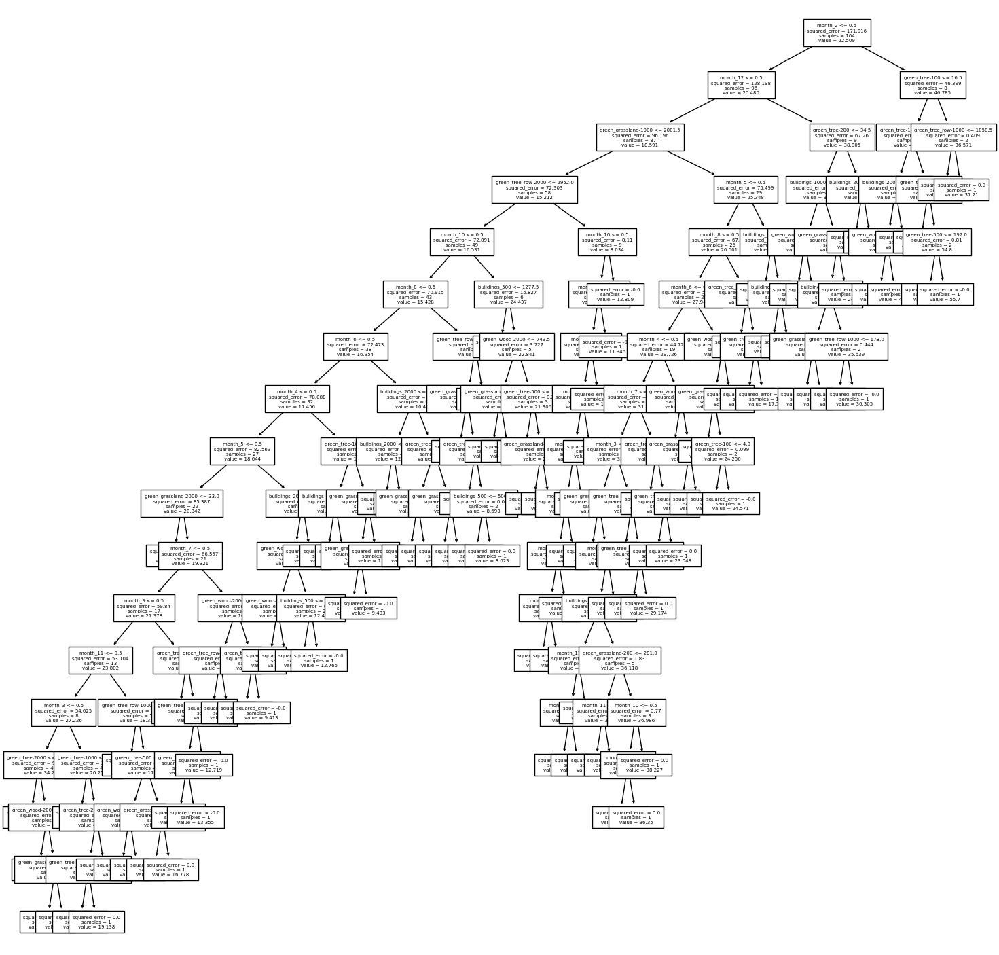

In [ ]:
plt.figure(figsize=(18,18))
tree.plot_tree(dtree, feature_names=list(X_train.columns), fontsize=5)

### Boosted Tree

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

In [ ]:
btree = GradientBoostingRegressor(learning_rate=0.1)
btree.fit(X_train, Y_train)

GradientBoostingRegressor()

In [ ]:
btree.score(X_test, Y_test)

0.3001708521765458

In [ ]:
comparison_r2["Gradient Boosting"] = kfold_r2(btree)
comparison_r2["Gradient Boosting"]

0.5192577036309738

### K nearest neighbours

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

In [ ]:
knn = KNeighborsRegressor(n_neighbors=10)
knn.fit(X_train, Y_train)

KNeighborsRegressor(n_neighbors=10)

In [ ]:
knn.score(X_test, Y_test)

0.07937992710825537

In [ ]:
comparison_r2["KNN"] = kfold_r2(knn)
comparison_r2["KNN"]

-0.3834588436624522

### Stochastic Gradient Descent

In [ ]:
from sklearn.linear_model import SGDRegressor

In [ ]:
sgd = SGDRegressor(loss="squared_error", alpha = 0.0001, max_iter = 1000000)
sgd.fit(X_train, Y_train)

SGDRegressor(max_iter=1000000)

In [ ]:
sgd.score(X_test, Y_test)

-8.20587591535239e+34

In [ ]:
comparison_r2["SGD"] = kfold_r2(sgd)
comparison_r2["SGD"]

-6.834109974662242e+34

In [ ]:
sgd.intercept_

array([-1.75391105e+10])

In [ ]:
pd.DataFrame(list(zip(list(X_train.columns), sgd.coef_)))

,0,1
0,month_2,2.382796e+10
1,month_3,3.718951e+10
2,month_4,1.115187e+10
3,month_5,4.588745e+10
4,month_6,-3.919840e+10
5,month_7,2.417009e+10
6,month_8,-2.630897e+10
7,month_9,-8.152715e+10
8,month_10,-1.958334e+10
9,month_11,-6.864561e+09


### Support Vector Machines

In [ ]:
from sklearn import svm

In [ ]:
svmr = svm.SVR(kernel='linear')
svmr.fit(X_train, Y_train)

SVR(kernel='linear')

In [ ]:
svmr.score(X_test, Y_test)

0.4238608632350772

In [ ]:
comparison_r2["SVM (linear)"] = kfold_r2(svmr)
comparison_r2["SVM (linear)"]

-13.918356420126551

In [ ]:
svmr.intercept_

array([6.57774218])

In [ ]:
pd.DataFrame(list(zip(list(X_train.columns), svmr.coef_)))

,0,1
0,month_2,"[6.0, 8.0, -8.999999999168189, -8.999999665409..."


## Comparison

In [ ]:
pd.DataFrame.from_dict(comparison_r2, orient='index').sort_values(0, ascending=False)

,0
Gradient Boosting,4.869074e-01
Linear Ridge,2.347772e-01
Linear Least Squares,1.606953e-01
Linear Lasso,-1.034862e-01
Tree,-3.044827e-01
KNN,-3.834588e-01
Linear ElasticNet,-6.233234e-01
SVM (linear),-1.391836e+01
SGD,-6.834110e+34
Linear LARS,-2.487661e+35


In [ ]:
pd.set_option('display.max_rows', 10)

# City estimate

total points: 182


<Axes: >

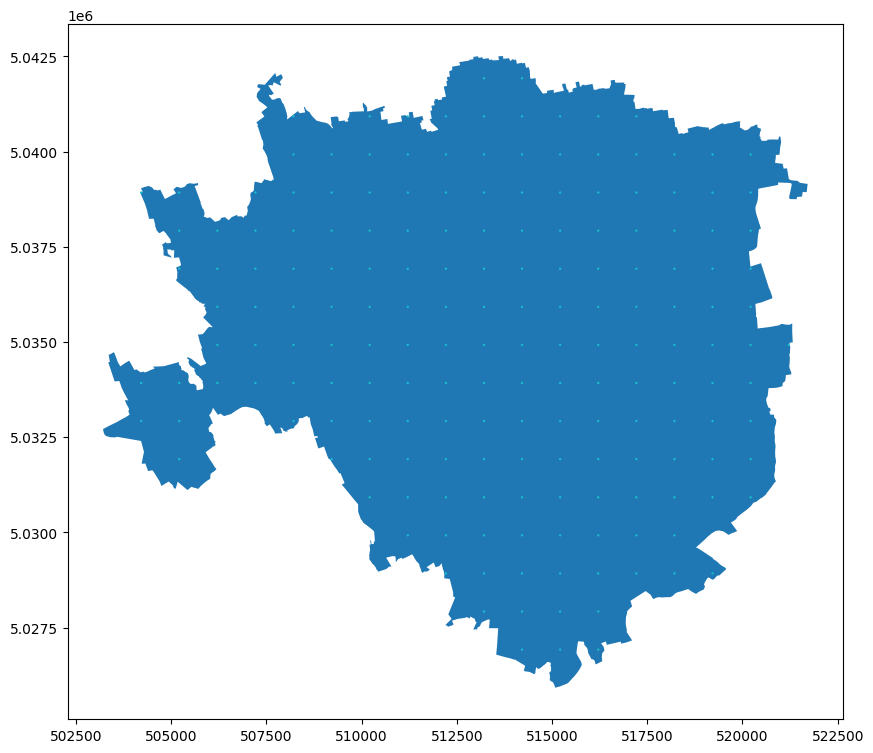

In [ ]:
# Point every 200 meters
milano_points = pd.DataFrame({"geometry": grid_points_in_polygon(milano, distance = 1000)})
milano_points = gpd.GeoDataFrame(milano_points, crs = comune.crs)
milano_points["dataset"] = "milano_points"
print("total points:", milano_points.shape[0])
gplot_milano(milano_points, figsize=(10,10), markersize=0.5)

# Hypotetical park

## Generate hypotetical

309.01936161855167


<Axes: >

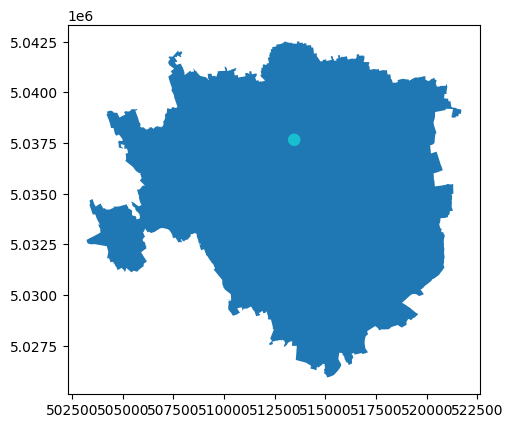

In [ ]:
hypotetical = pd.DataFrame([
    {
        'name': "Progetto Scalo Farini",
        'lat': "45.49230736253652",
        'lon': "9.172254421336875",
    }
])
hypotetical["dataset"] = "hypotetical"
hypotetical = gpd.GeoDataFrame(hypotetical, geometry=gpd.points_from_xy(hypotetical.lon, hypotetical.lat), crs="EPSG:4326")
hypotetical = hypotetical.to_crs("epsg:32632")
# Progetto Scalo Farini avrà un area verde nuova di 300 000 m^2
r = math.sqrt(300000/math.pi)
print(r)
hypotetical.loc[0, 'geometry'] = hypotetical.loc[0].geometry.buffer(r)
gplot_milano(hypotetical)

## To Points

In [ ]:
# Genera alberi ogni 3 metri per lo scalo farini

hypotetical_points, indices = generate_points(hypotetical, points_per_sqm=1/3, points_per_meter=1/3)

points_df = pd.DataFrame({
    'geometry': hypotetical_points,
    'index': indices
})

hypotetical_points = hypotetical.loc[points_df['index']].reset_index(drop=True)
hypotetical_points['geometry'] = points_df['geometry'].values
hypotetical_points['natural'] = "tree"
hypotetical_points = hypotetical_points[['natural', 'geometry', 'dataset']]
hypotetical_points

,natural,geometry,dataset
0,tree,POINT (513292.544 5037408.357),hypotetical
1,tree,POINT (513418.920 5037400.235),hypotetical
2,tree,POINT (513356.690 5037709.165),hypotetical
3,tree,POINT (513342.843 5037836.306),hypotetical
4,tree,POINT (513311.077 5037651.358),hypotetical
...,...,...,...
99834,tree,POINT (513587.468 5037772.294),hypotetical
99835,tree,POINT (513733.051 5037638.233),hypotetical
99836,tree,POINT (513704.453 5037603.728),hypotetical
99837,tree,POINT (513186.131 5037604.505),hypotetical


## To Areas

,id,name,geometry,dataset,latitudine,longitudine
0,44216,Centro,POINT (514254.769 5034260.134),sc_chosen_stations,5.034260e+06,514254.768800
1,40256,Porta Vittoria,POINT (516400.569 5034308.395),sc_chosen_stations,5.034308e+06,516400.568968
2,32399,Via Meda,POINT (513926.824 5031844.054),sc_chosen_stations,5.031844e+06,513926.823619
3,70169,Lodi,POINT (516599.959 5032086.080),sc_chosen_stations,5.032086e+06,516599.959025
4,50128,Piazza Leonardo,POINT (517514.386 5036052.144),sc_chosen_stations,5.036052e+06,517514.386254
5,32393,Via Ripamonti Fine,POINT (516145.039 5030310.204),sc_chosen_stations,5.030310e+06,516145.039236
6,22851,Forlanini,POINT (518761.742 5034068.738),sc_chosen_stations,5.034069e+06,518761.742008
7,24644,Villapizzone,POINT (511392.183 5038741.671),sc_chosen_stations,5.038742e+06,511392.183023
8,2,via Pascal *,POINT (518351.042 5035645.702),stations_milano,5.035646e+06,518351.042247
9,4,viale Marche,POINT (514910.677 5038103.127),stations_milano,5.038103e+06,514910.676585


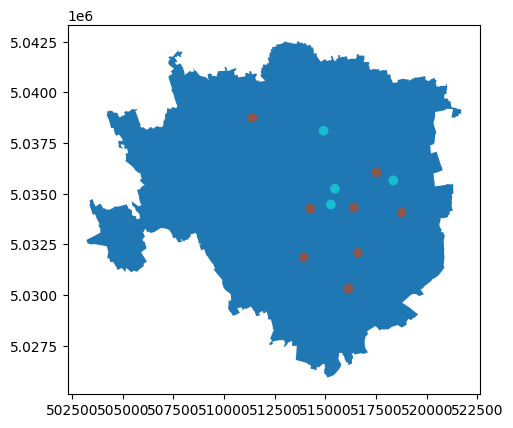

In [ ]:
# aggiunte colonne id (necessaria per fare il join con i dati di rilevazione dell'aria) e dataset (per i plot)
sc_stations_filtered = sc_stations[['id', 'name', 'geometry', 'dataset']]
# eliminate le stazioni che non coprono il 2023, anno su cui abbiamo i dati delle rilevazioni
stations_milano_filtered = stations_milano[(stations_milano['inizio_operativita'] < '2023-01-01') & (stations_milano['fine_operativita'] >= '2024-01-01')]
stations_milano_filtered = stations_milano_filtered[['id', 'name', 'geometry', 'dataset']]

concatenated_stations = gdf_merge([sc_stations_filtered, stations_milano_filtered])

concatenated_stations['latitudine'] = concatenated_stations.geometry.y
concatenated_stations['longitudine'] = concatenated_stations.geometry.x

gplot_milano(concatenated_stations)
concatenated_stations

In [ ]:
for idx, stazione in concatenated_stations.iterrows():
  print(stazione.id)

44216
40256
32399
70169
50128
32393
22851
24644
2
4
6
7


In [ ]:
# Calcolo delle distanze e divisione per settori per ogni stazione
colonne = ['natural', 'geometry', 'distance', 'raggio', 'angolo', 'settore', 'area']
hypotetical_points_per_areas = gpd.GeoDataFrame(columns=['stazione'] + colonne, crs = "EPSG:32632")
for idx, stazione in concatenated_stations.iterrows():
    tmp = divide_in_areas(stazione.geometry, hypotetical_points)
    tmp = tmp[colonne]
    tmp['stazione'] = stazione['id']
    hypotetical_points_per_areas = gpd.GeoDataFrame(pd.concat([hypotetical_points_per_areas, tmp]), crs = "EPSG:32632")
hypotetical_points_per_areas

,stazione,natural,geometry,distance,raggio,angolo,settore,area
0,44216,tree,POINT (513292.544 5037408.357),3291.988114,inf,-16.995279,8,inf-8
1,44216,tree,POINT (513418.920 5037400.235),3249.443284,inf,-14.905667,8,inf-8
2,44216,tree,POINT (513356.690 5037709.165),3564.037628,inf,-14.594923,8,inf-8
3,44216,tree,POINT (513342.843 5037836.306),3690.612637,inf,-14.305580,8,inf-8
4,44216,tree,POINT (513311.077 5037651.358),3520.079162,inf,-15.550537,8,inf-8
...,...,...,...,...,...,...,...,...
99834,7,tree,POINT (513587.468 5037772.294),3715.533109,inf,-26.945897,8,inf-8
99835,7,tree,POINT (513733.051 5037638.233),3530.730750,inf,-25.825663,8,inf-8
99836,7,tree,POINT (513704.453 5037603.728),3512.367521,inf,-26.490794,8,inf-8
99837,7,tree,POINT (513186.131 5037604.505),3772.848408,inf,-33.548326,8,inf-8


In [ ]:
hypotetical_points_per_areas.groupby("stazione").count()

,natural,geometry,distance,raggio,angolo,settore,area
stazione,,,,,,,
2,99839,99839,99839,99839,99839,99839,99839
4,99839,99839,99839,99839,99839,99839,99839
6,99839,99839,99839,99839,99839,99839,99839
7,99839,99839,99839,99839,99839,99839,99839
22851,99839,99839,99839,99839,99839,99839,99839
...,...,...,...,...,...,...,...
32399,99839,99839,99839,99839,99839,99839,99839
40256,99839,99839,99839,99839,99839,99839,99839
44216,99839,99839,99839,99839,99839,99839,99839


In [ ]:
hypotetical_points_per_areas.groupby("area").count()

,stazione,natural,geometry,distance,raggio,angolo,settore
area,,,,,,,
2000-6,99839,99839,99839,99839,99839,99839,99839
inf-3,99839,99839,99839,99839,99839,99839,99839
inf-7,301634,301634,301634,301634,301634,301634,301634
inf-8,696756,696756,696756,696756,696756,696756,696756


In [ ]:
hypotetical_points_per_areas.groupby("raggio").count()

,stazione,natural,geometry,distance,angolo,settore,area
raggio,,,,,,,
2000,99839,99839,99839,99839,99839,99839,99839
inf,1098229,1098229,1098229,1098229,1098229,1098229,1098229


In [ ]:
hypotetical_points_per_areas['raggio'] = hypotetical_points_per_areas['raggio'].apply(lambda x: x if x == 'inf' else x+".0")

In [ ]:
hypotetical_points_per_areas["area"] = "-"
hypotetical_points_per_areas["area"] = hypotetical_points_per_areas["raggio"] + hypotetical_points_per_areas["area"] + hypotetical_points_per_areas["settore"]

In [ ]:
hypotetical_points_per_areas.groupby("area").count()

,stazione,natural,geometry,distance,raggio,angolo,settore
area,,,,,,,
2000.0-6,99839,99839,99839,99839,99839,99839,99839
inf-3,99839,99839,99839,99839,99839,99839,99839
inf-7,301634,301634,301634,301634,301634,301634,301634
inf-8,696756,696756,696756,696756,696756,696756,696756


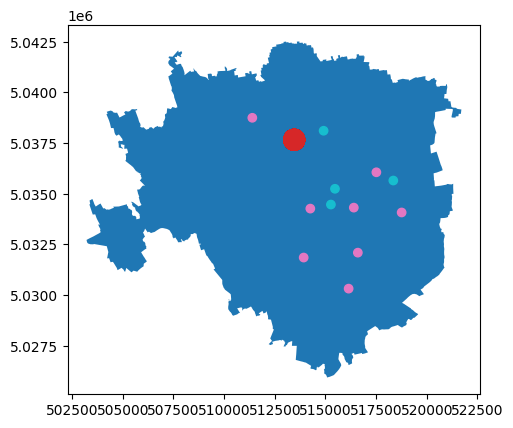

In [ ]:
hypotetical_points_per_areas["dataset"] = "hypotetical_points_per_areas"
gplot_milano([hypotetical_points_per_areas.head(10000), stations])
del hypotetical_points_per_areas["dataset"]

In [ ]:
hypotetical_points_per_areas.stazione = hypotetical_points_per_areas.stazione.astype(int)

In [ ]:
file_path = os.path.join(CSV_AND_JSON_FOLDER, 'hypotetical_scalofarini_in_areas.feather')
hypotetical_points_per_areas.to_feather(file_path, index=False)

In [ ]:
hypotetical_points_per_areas = gpd_dataframes["hypotetical_scalofarini_in_areas.feather"]
hypotetical_points_per_areas.head()

,stazione,natural,geometry,distance,raggio,angolo,settore,area
0,44216,tree,POINT (513292.544 5037408.357),3291.988114,inf,-16.995279,8,inf-8
1,44216,tree,POINT (513418.920 5037400.235),3249.443284,inf,-14.905667,8,inf-8
2,44216,tree,POINT (513356.690 5037709.165),3564.037628,inf,-14.594923,8,inf-8
3,44216,tree,POINT (513342.843 5037836.306),3690.612637,inf,-14.305580,8,inf-8
4,44216,tree,POINT (513311.077 5037651.358),3520.079162,inf,-15.550537,8,inf-8


In [ ]:
natural

['tree',
 'shrub',
 'grassland',
 'wood',
 'tree_row',
 'forest',
 'wetland',
 'scrub',
 'tree_group']

In [ ]:
hypotetical_points_per_areas.loc[:,"natural"] = "grassland"

In [ ]:
green_divided_in_areas_hypotetical = gpd.GeoDataFrame(pd.concat([green_divided_in_areas, hypotetical_points_per_areas]), crs = "EPSG:32632")
green_divided_in_areas_hypotetical.stazione = green_divided_in_areas_hypotetical.stazione.astype(int)

In [ ]:
print(green_divided_in_areas.size)
print(green_divided_in_areas_hypotetical.size)

75697152
85281696


In [ ]:
n_4_original = green_divided_in_areas[green_divided_in_areas["stazione"] == 4].shape[0]
n_4_hyp = green_divided_in_areas_hypotetical[green_divided_in_areas_hypotetical["stazione"] == 4].shape[0]
n_4_hyp_only = hypotetical_points_per_areas[hypotetical_points_per_areas["stazione"] == 4].shape[0]
print(n_4_original)
print(n_4_hyp)
print(n_4_hyp_only)
print(n_4_hyp - n_4_original)
print(99839) # hypotetical_points.size[0]

788512
888351
99839
99839
99839


In [ ]:
hypotetical_points_per_areas[hypotetical_points_per_areas["stazione"] == 4].groupby("area").count()

,stazione,natural,geometry,distance,raggio,angolo,settore
area,,,,,,,
2000.0-6,99839,99839,99839,99839,99839,99839,99839


In [ ]:
pd.set_option('display.max_rows', None)
green_divided_in_areas_hypotetical[green_divided_in_areas_hypotetical["stazione"] == 4].groupby("area").count()

,stazione,natural,geometry,distance,raggio,angolo,settore
area,,,,,,,
100.0-1,3,3,3,3,3,3,3
100.0-2,4,4,4,4,4,4,4
100.0-7,3,3,3,3,3,3,3
100.0-8,7,7,7,7,7,7,7
1000.0-1,1675,1675,1675,1675,1675,1675,1675
1000.0-2,559,559,559,559,559,559,559
1000.0-3,1377,1377,1377,1377,1377,1377,1377
1000.0-4,387,387,387,387,387,387,387
1000.0-5,347,347,347,347,347,347,347


In [ ]:
green_divided_in_areas[green_divided_in_areas["stazione"] == 4].groupby("area").count()

,stazione,natural,geometry,distance,raggio,angolo,settore
area,,,,,,,
100.0-1,3,3,3,3,3,3,3
100.0-2,4,4,4,4,4,4,4
100.0-7,3,3,3,3,3,3,3
100.0-8,7,7,7,7,7,7,7
1000.0-1,1675,1675,1675,1675,1675,1675,1675
1000.0-2,559,559,559,559,559,559,559
1000.0-3,1377,1377,1377,1377,1377,1377,1377
1000.0-4,387,387,387,387,387,387,387
1000.0-5,347,347,347,347,347,347,347


In [ ]:
pd.set_option('display.max_rows', 10)

## stations hypotetical augmentation

In [ ]:
def augmentation_hypotetical_green(crs):
  def augmentation_hypotetical_green_apllyfunc(stations_df_row):
    tmp_station = gpd.GeoDataFrame(pd.DataFrame([stations_df_row]), geometry="geometry", crs=crs)
    tmp_station["id"] = pd.to_numeric(tmp_station["id"])
    tmp_green = green_divided_in_areas_hypotetical[green_divided_in_areas_hypotetical["stazione"] == tmp_station["id"].iloc[0]]
    tmp_green = tmp_green[tmp_green["raggio"] != "inf"]
    tmp_green["natural-and-area"] = "-"
    tmp_green["natural-and-area"] = tmp_green["natural"] + tmp_green["natural-and-area"] + tmp_green["area"]
    tmp_green = tmp_green.groupby(["natural-and-area"])[["geometry"]].count()
    tmp_green = tmp_green.reindex(all_natural_and_areas(), fill_value=0)
    return pd.Series([
        # geometry now is "count"
        tmp_green.loc[a]["geometry"] for a in all_natural_and_areas()
    ])
  return augmentation_hypotetical_green_apllyfunc

In [ ]:
stations_hypotetical = stations.copy()
stations_hypotetical[["green_"+a for a in all_natural_and_areas()]] = stations_hypotetical.apply(augmentation_hypotetical_green(stations_hypotetical.crs), axis=1)
stations_hypotetical

,id,name,geometry,dataset,x,y,stations_milano,stations_sc,green_tree-100.0-1,green_tree-100.0-2,green_tree-100.0-3,green_tree-100.0-4,green_tree-100.0-5,green_tree-100.0-6,green_tree-100.0-7,green_tree-100.0-8,green_tree-200.0-1,green_tree-200.0-2,green_tree-200.0-3,green_tree-200.0-4,green_tree-200.0-5,green_tree-200.0-6,green_tree-200.0-7,green_tree-200.0-8,green_tree-500.0-1,green_tree-500.0-2,green_tree-500.0-3,green_tree-500.0-4,green_tree-500.0-5,green_tree-500.0-6,green_tree-500.0-7,green_tree-500.0-8,green_tree-1000.0-1,green_tree-1000.0-2,green_tree-1000.0-3,green_tree-1000.0-4,green_tree-1000.0-5,green_tree-1000.0-6,green_tree-1000.0-7,green_tree-1000.0-8,green_tree-2000.0-1,green_tree-2000.0-2,green_tree-2000.0-3,green_tree-2000.0-4,green_tree-2000.0-5,green_tree-2000.0-6,green_tree-2000.0-7,green_tree-2000.0-8,green_shrub-100.0-1,green_shrub-100.0-2,green_shrub-100.0-3,green_shrub-100.0-4,green_shrub-100.0-5,green_shrub-100.0-6,green_shrub-100.0-7,green_shrub-100.0-8,green_shrub-200.0-1,green_shrub-200.0-2,green_shrub-200.0-3,green_shrub-200.0-4,green_shrub-200.0-5,green_shrub-200.0-6,green_shrub-200.0-7,green_shrub-200.0-8,green_shrub-500.0-1,green_shrub-500.0-2,green_shrub-500.0-3,green_shrub-500.0-4,green_shrub-500.0-5,green_shrub-500.0-6,green_shrub-500.0-7,green_shrub-500.0-8,green_shrub-1000.0-1,green_shrub-1000.0-2,green_shrub-1000.0-3,green_shrub-1000.0-4,green_shrub-1000.0-5,green_shrub-1000.0-6,green_shrub-1000.0-7,green_shrub-1000.0-8,green_shrub-2000.0-1,green_shrub-2000.0-2,green_shrub-2000.0-3,green_shrub-2000.0-4,green_shrub-2000.0-5,green_shrub-2000.0-6,green_shrub-2000.0-7,green_shrub-2000.0-8,green_grassland-100.0-1,green_grassland-100.0-2,green_grassland-100.0-3,green_grassland-100.0-4,green_grassland-100.0-5,green_grassland-100.0-6,green_grassland-100.0-7,green_grassland-100.0-8,green_grassland-200.0-1,green_grassland-200.0-2,green_grassland-200.0-3,green_grassland-200.0-4,green_grassland-200.0-5,green_grassland-200.0-6,green_grassland-200.0-7,green_grassland-200.0-8,green_grassland-500.0-1,green_grassland-500.0-2,green_grassland-500.0-3,green_grassland-500.0-4,green_grassland-500.0-5,green_grassland-500.0-6,green_grassland-500.0-7,green_grassland-500.0-8,green_grassland-1000.0-1,green_grassland-1000.0-2,green_grassland-1000.0-3,green_grassland-1000.0-4,green_grassland-1000.0-5,green_grassland-1000.0-6,green_grassland-1000.0-7,green_grassland-1000.0-8,green_grassland-2000.0-1,green_grassland-2000.0-2,green_grassland-2000.0-3,green_grassland-2000.0-4,green_grassland-2000.0-5,green_grassland-2000.0-6,green_grassland-2000.0-7,green_grassland-2000.0-8,green_wood-100.0-1,green_wood-100.0-2,green_wood-100.0-3,green_wood-100.0-4,green_wood-100.0-5,green_wood-100.0-6,green_wood-100.0-7,green_wood-100.0-8,green_wood-200.0-1,green_wood-200.0-2,green_wood-200.0-3,green_wood-200.0-4,green_wood-200.0-5,green_wood-200.0-6,green_wood-200.0-7,green_wood-200.0-8,green_wood-500.0-1,green_wood-500.0-2,green_wood-500.0-3,green_wood-500.0-4,green_wood-500.0-5,green_wood-500.0-6,green_wood-500.0-7,green_wood-500.0-8,green_wood-1000.0-1,green_wood-1000.0-2,green_wood-1000.0-3,green_wood-1000.0-4,green_wood-1000.0-5,green_wood-1000.0-6,green_wood-1000.0-7,green_wood-1000.0-8,green_wood-2000.0-1,green_wood-2000.0-2,green_wood-2000.0-3,green_wood-2000.0-4,green_wood-2000.0-5,green_wood-2000.0-6,green_wood-2000.0-7,green_wood-2000.0-8,green_tree_row-100.0-1,green_tree_row-100.0-2,green_tree_row-100.0-3,green_tree_row-100.0-4,green_tree_row-100.0-5,green_tree_row-100.0-6,green_tree_row-100.0-7,green_tree_row-100.0-8,green_tree_row-200.0-1,green_tree_row-200.0-2,green_tree_row-200.0-3,green_tree_row-200.0-4,green_tree_row-200.0-5,green_tree_row-200.0-6,green_tree_row-200.0-7,green_tree_row-200.0-8,green_tree_row-500.0-1,green_tree_row-500.0-2,green_tree_row-500.0-3,green_tree_row-500.0-4,green_tree_row-500.0-5,green_tree_row-500.0-6,green_tree_row-500.0-7,green_tree_row-500.0-8,green_tree_row-1000.0-1,green_tree_row-1000.0-

In [ ]:
pd.set_option('display.max_columns', None)
pd.concat([stations[stations["id"] == 4], stations_hypotetical[stations["id"] == 4]])

,id,name,geometry,dataset,x,y,stations_milano,stations_sc,green_tree-100.0-1,green_tree-100.0-2,green_tree-100.0-3,green_tree-100.0-4,green_tree-100.0-5,green_tree-100.0-6,green_tree-100.0-7,green_tree-100.0-8,green_tree-200.0-1,green_tree-200.0-2,green_tree-200.0-3,green_tree-200.0-4,green_tree-200.0-5,green_tree-200.0-6,green_tree-200.0-7,green_tree-200.0-8,green_tree-500.0-1,green_tree-500.0-2,green_tree-500.0-3,green_tree-500.0-4,green_tree-500.0-5,green_tree-500.0-6,green_tree-500.0-7,green_tree-500.0-8,green_tree-1000.0-1,green_tree-1000.0-2,green_tree-1000.0-3,green_tree-1000.0-4,green_tree-1000.0-5,green_tree-1000.0-6,green_tree-1000.0-7,green_tree-1000.0-8,green_tree-2000.0-1,green_tree-2000.0-2,green_tree-2000.0-3,green_tree-2000.0-4,green_tree-2000.0-5,green_tree-2000.0-6,green_tree-2000.0-7,green_tree-2000.0-8,green_shrub-100.0-1,green_shrub-100.0-2,green_shrub-100.0-3,green_shrub-100.0-4,green_shrub-100.0-5,green_shrub-100.0-6,green_shrub-100.0-7,green_shrub-100.0-8,green_shrub-200.0-1,green_shrub-200.0-2,green_shrub-200.0-3,green_shrub-200.0-4,green_shrub-200.0-5,green_shrub-200.0-6,green_shrub-200.0-7,green_shrub-200.0-8,green_shrub-500.0-1,green_shrub-500.0-2,green_shrub-500.0-3,green_shrub-500.0-4,green_shrub-500.0-5,green_shrub-500.0-6,green_shrub-500.0-7,green_shrub-500.0-8,green_shrub-1000.0-1,green_shrub-1000.0-2,green_shrub-1000.0-3,green_shrub-1000.0-4,green_shrub-1000.0-5,green_shrub-1000.0-6,green_shrub-1000.0-7,green_shrub-1000.0-8,green_shrub-2000.0-1,green_shrub-2000.0-2,green_shrub-2000.0-3,green_shrub-2000.0-4,green_shrub-2000.0-5,green_shrub-2000.0-6,green_shrub-2000.0-7,green_shrub-2000.0-8,green_grassland-100.0-1,green_grassland-100.0-2,green_grassland-100.0-3,green_grassland-100.0-4,green_grassland-100.0-5,green_grassland-100.0-6,green_grassland-100.0-7,green_grassland-100.0-8,green_grassland-200.0-1,green_grassland-200.0-2,green_grassland-200.0-3,green_grassland-200.0-4,green_grassland-200.0-5,green_grassland-200.0-6,green_grassland-200.0-7,green_grassland-200.0-8,green_grassland-500.0-1,green_grassland-500.0-2,green_grassland-500.0-3,green_grassland-500.0-4,green_grassland-500.0-5,green_grassland-500.0-6,green_grassland-500.0-7,green_grassland-500.0-8,green_grassland-1000.0-1,green_grassland-1000.0-2,green_grassland-1000.0-3,green_grassland-1000.0-4,green_grassland-1000.0-5,green_grassland-1000.0-6,green_grassland-1000.0-7,green_grassland-1000.0-8,green_grassland-2000.0-1,green_grassland-2000.0-2,green_grassland-2000.0-3,green_grassland-2000.0-4,green_grassland-2000.0-5,green_grassland-2000.0-6,green_grassland-2000.0-7,green_grassland-2000.0-8,green_wood-100.0-1,green_wood-100.0-2,green_wood-100.0-3,green_wood-100.0-4,green_wood-100.0-5,green_wood-100.0-6,green_wood-100.0-7,green_wood-100.0-8,green_wood-200.0-1,green_wood-200.0-2,green_wood-200.0-3,green_wood-200.0-4,green_wood-200.0-5,green_wood-200.0-6,green_wood-200.0-7,green_wood-200.0-8,green_wood-500.0-1,green_wood-500.0-2,green_wood-500.0-3,green_wood-500.0-4,green_wood-500.0-5,green_wood-500.0-6,green_wood-500.0-7,green_wood-500.0-8,green_wood-1000.0-1,green_wood-1000.0-2,green_wood-1000.0-3,green_wood-1000.0-4,green_wood-1000.0-5,green_wood-1000.0-6,green_wood-1000.0-7,green_wood-1000.0-8,green_wood-2000.0-1,green_wood-2000.0-2,green_wood-2000.0-3,green_wood-2000.0-4,green_wood-2000.0-5,green_wood-2000.0-6,green_wood-2000.0-7,green_wood-2000.0-8,green_tree_row-100.0-1,green_tree_row-100.0-2,green_tree_row-100.0-3,green_tree_row-100.0-4,green_tree_row-100.0-5,green_tree_row-100.0-6,green_tree_row-100.0-7,green_tree_row-100.0-8,green_tree_row-200.0-1,green_tree_row-200.0-2,green_tree_row-200.0-3,green_tree_row-200.0-4,green_tree_row-200.0-5,green_tree_row-200.0-6,green_tree_row-200.0-7,green_tree_row-200.0-8,green_tree_row-500.0-1,green_tree_row-500.0-2,green_tree_row-500.0-3,green_tree_row-500.0-4,green_tree_row-500.0-5,green_tree_row-500.0-6,green_tree_row-500.0-7,green_tree_row-500.0-8,green_tree_row-1000.0-1,green_tree_row-1000.0-

In [ ]:
stations_hypotetical[["buildings_"+a for a in all_areas()]] = stations_hypotetical.apply(augmentation_buildings(stations_hypotetical.crs), axis=1)
stations_hypotetical

,id,name,geometry,dataset,x,y,stations_milano,stations_sc,green_tree-100.0-1,green_tree-100.0-2,green_tree-100.0-3,green_tree-100.0-4,green_tree-100.0-5,green_tree-100.0-6,green_tree-100.0-7,green_tree-100.0-8,green_tree-200.0-1,green_tree-200.0-2,green_tree-200.0-3,green_tree-200.0-4,green_tree-200.0-5,green_tree-200.0-6,green_tree-200.0-7,green_tree-200.0-8,green_tree-500.0-1,green_tree-500.0-2,green_tree-500.0-3,green_tree-500.0-4,green_tree-500.0-5,green_tree-500.0-6,green_tree-500.0-7,green_tree-500.0-8,green_tree-1000.0-1,green_tree-1000.0-2,green_tree-1000.0-3,green_tree-1000.0-4,green_tree-1000.0-5,green_tree-1000.0-6,green_tree-1000.0-7,green_tree-1000.0-8,green_tree-2000.0-1,green_tree-2000.0-2,green_tree-2000.0-3,green_tree-2000.0-4,green_tree-2000.0-5,green_tree-2000.0-6,green_tree-2000.0-7,green_tree-2000.0-8,green_shrub-100.0-1,green_shrub-100.0-2,green_shrub-100.0-3,green_shrub-100.0-4,green_shrub-100.0-5,green_shrub-100.0-6,green_shrub-100.0-7,green_shrub-100.0-8,green_shrub-200.0-1,green_shrub-200.0-2,green_shrub-200.0-3,green_shrub-200.0-4,green_shrub-200.0-5,green_shrub-200.0-6,green_shrub-200.0-7,green_shrub-200.0-8,green_shrub-500.0-1,green_shrub-500.0-2,green_shrub-500.0-3,green_shrub-500.0-4,green_shrub-500.0-5,green_shrub-500.0-6,green_shrub-500.0-7,green_shrub-500.0-8,green_shrub-1000.0-1,green_shrub-1000.0-2,green_shrub-1000.0-3,green_shrub-1000.0-4,green_shrub-1000.0-5,green_shrub-1000.0-6,green_shrub-1000.0-7,green_shrub-1000.0-8,green_shrub-2000.0-1,green_shrub-2000.0-2,green_shrub-2000.0-3,green_shrub-2000.0-4,green_shrub-2000.0-5,green_shrub-2000.0-6,green_shrub-2000.0-7,green_shrub-2000.0-8,green_grassland-100.0-1,green_grassland-100.0-2,green_grassland-100.0-3,green_grassland-100.0-4,green_grassland-100.0-5,green_grassland-100.0-6,green_grassland-100.0-7,green_grassland-100.0-8,green_grassland-200.0-1,green_grassland-200.0-2,green_grassland-200.0-3,green_grassland-200.0-4,green_grassland-200.0-5,green_grassland-200.0-6,green_grassland-200.0-7,green_grassland-200.0-8,green_grassland-500.0-1,green_grassland-500.0-2,green_grassland-500.0-3,green_grassland-500.0-4,green_grassland-500.0-5,green_grassland-500.0-6,green_grassland-500.0-7,green_grassland-500.0-8,green_grassland-1000.0-1,green_grassland-1000.0-2,green_grassland-1000.0-3,green_grassland-1000.0-4,green_grassland-1000.0-5,green_grassland-1000.0-6,green_grassland-1000.0-7,green_grassland-1000.0-8,green_grassland-2000.0-1,green_grassland-2000.0-2,green_grassland-2000.0-3,green_grassland-2000.0-4,green_grassland-2000.0-5,green_grassland-2000.0-6,green_grassland-2000.0-7,green_grassland-2000.0-8,green_wood-100.0-1,green_wood-100.0-2,green_wood-100.0-3,green_wood-100.0-4,green_wood-100.0-5,green_wood-100.0-6,green_wood-100.0-7,green_wood-100.0-8,green_wood-200.0-1,green_wood-200.0-2,green_wood-200.0-3,green_wood-200.0-4,green_wood-200.0-5,green_wood-200.0-6,green_wood-200.0-7,green_wood-200.0-8,green_wood-500.0-1,green_wood-500.0-2,green_wood-500.0-3,green_wood-500.0-4,green_wood-500.0-5,green_wood-500.0-6,green_wood-500.0-7,green_wood-500.0-8,green_wood-1000.0-1,green_wood-1000.0-2,green_wood-1000.0-3,green_wood-1000.0-4,green_wood-1000.0-5,green_wood-1000.0-6,green_wood-1000.0-7,green_wood-1000.0-8,green_wood-2000.0-1,green_wood-2000.0-2,green_wood-2000.0-3,green_wood-2000.0-4,green_wood-2000.0-5,green_wood-2000.0-6,green_wood-2000.0-7,green_wood-2000.0-8,green_tree_row-100.0-1,green_tree_row-100.0-2,green_tree_row-100.0-3,green_tree_row-100.0-4,green_tree_row-100.0-5,green_tree_row-100.0-6,green_tree_row-100.0-7,green_tree_row-100.0-8,green_tree_row-200.0-1,green_tree_row-200.0-2,green_tree_row-200.0-3,green_tree_row-200.0-4,green_tree_row-200.0-5,green_tree_row-200.0-6,green_tree_row-200.0-7,green_tree_row-200.0-8,green_tree_row-500.0-1,green_tree_row-500.0-2,green_tree_row-500.0-3,green_tree_row-500.0-4,green_tree_row-500.0-5,green_tree_row-500.0-6,green_tree_row-500.0-7,green_tree_row-500.0-8,green_tree_row-1000.0-1,green_tree_row-1000.0-

## final hypotetical

In [ ]:
stations_hypotetical.id = stations_hypotetical.id.astype(int)
final_hypotetical = pd.merge(stations_hypotetical, air, on="id")
final_hypotetical["id"].value_counts()

id
2        12
4        12
6        12
44216    12
70169    12
         ..
32393    12
22851    12
24644    12
40256    11
32399    11
Name: count, Length: 11, dtype: int64

In [ ]:
final_hypotetical[final_hypotetical["id"] == 4]

,id,name,geometry,dataset,x,y,stations_milano,stations_sc,green_tree-100.0-1,green_tree-100.0-2,green_tree-100.0-3,green_tree-100.0-4,green_tree-100.0-5,green_tree-100.0-6,green_tree-100.0-7,green_tree-100.0-8,green_tree-200.0-1,green_tree-200.0-2,green_tree-200.0-3,green_tree-200.0-4,green_tree-200.0-5,green_tree-200.0-6,green_tree-200.0-7,green_tree-200.0-8,green_tree-500.0-1,green_tree-500.0-2,green_tree-500.0-3,green_tree-500.0-4,green_tree-500.0-5,green_tree-500.0-6,green_tree-500.0-7,green_tree-500.0-8,green_tree-1000.0-1,green_tree-1000.0-2,green_tree-1000.0-3,green_tree-1000.0-4,green_tree-1000.0-5,green_tree-1000.0-6,green_tree-1000.0-7,green_tree-1000.0-8,green_tree-2000.0-1,green_tree-2000.0-2,green_tree-2000.0-3,green_tree-2000.0-4,green_tree-2000.0-5,green_tree-2000.0-6,green_tree-2000.0-7,green_tree-2000.0-8,green_shrub-100.0-1,green_shrub-100.0-2,green_shrub-100.0-3,green_shrub-100.0-4,green_shrub-100.0-5,green_shrub-100.0-6,green_shrub-100.0-7,green_shrub-100.0-8,green_shrub-200.0-1,green_shrub-200.0-2,green_shrub-200.0-3,green_shrub-200.0-4,green_shrub-200.0-5,green_shrub-200.0-6,green_shrub-200.0-7,green_shrub-200.0-8,green_shrub-500.0-1,green_shrub-500.0-2,green_shrub-500.0-3,green_shrub-500.0-4,green_shrub-500.0-5,green_shrub-500.0-6,green_shrub-500.0-7,green_shrub-500.0-8,green_shrub-1000.0-1,green_shrub-1000.0-2,green_shrub-1000.0-3,green_shrub-1000.0-4,green_shrub-1000.0-5,green_shrub-1000.0-6,green_shrub-1000.0-7,green_shrub-1000.0-8,green_shrub-2000.0-1,green_shrub-2000.0-2,green_shrub-2000.0-3,green_shrub-2000.0-4,green_shrub-2000.0-5,green_shrub-2000.0-6,green_shrub-2000.0-7,green_shrub-2000.0-8,green_grassland-100.0-1,green_grassland-100.0-2,green_grassland-100.0-3,green_grassland-100.0-4,green_grassland-100.0-5,green_grassland-100.0-6,green_grassland-100.0-7,green_grassland-100.0-8,green_grassland-200.0-1,green_grassland-200.0-2,green_grassland-200.0-3,green_grassland-200.0-4,green_grassland-200.0-5,green_grassland-200.0-6,green_grassland-200.0-7,green_grassland-200.0-8,green_grassland-500.0-1,green_grassland-500.0-2,green_grassland-500.0-3,green_grassland-500.0-4,green_grassland-500.0-5,green_grassland-500.0-6,green_grassland-500.0-7,green_grassland-500.0-8,green_grassland-1000.0-1,green_grassland-1000.0-2,green_grassland-1000.0-3,green_grassland-1000.0-4,green_grassland-1000.0-5,green_grassland-1000.0-6,green_grassland-1000.0-7,green_grassland-1000.0-8,green_grassland-2000.0-1,green_grassland-2000.0-2,green_grassland-2000.0-3,green_grassland-2000.0-4,green_grassland-2000.0-5,green_grassland-2000.0-6,green_grassland-2000.0-7,green_grassland-2000.0-8,green_wood-100.0-1,green_wood-100.0-2,green_wood-100.0-3,green_wood-100.0-4,green_wood-100.0-5,green_wood-100.0-6,green_wood-100.0-7,green_wood-100.0-8,green_wood-200.0-1,green_wood-200.0-2,green_wood-200.0-3,green_wood-200.0-4,green_wood-200.0-5,green_wood-200.0-6,green_wood-200.0-7,green_wood-200.0-8,green_wood-500.0-1,green_wood-500.0-2,green_wood-500.0-3,green_wood-500.0-4,green_wood-500.0-5,green_wood-500.0-6,green_wood-500.0-7,green_wood-500.0-8,green_wood-1000.0-1,green_wood-1000.0-2,green_wood-1000.0-3,green_wood-1000.0-4,green_wood-1000.0-5,green_wood-1000.0-6,green_wood-1000.0-7,green_wood-1000.0-8,green_wood-2000.0-1,green_wood-2000.0-2,green_wood-2000.0-3,green_wood-2000.0-4,green_wood-2000.0-5,green_wood-2000.0-6,green_wood-2000.0-7,green_wood-2000.0-8,green_tree_row-100.0-1,green_tree_row-100.0-2,green_tree_row-100.0-3,green_tree_row-100.0-4,green_tree_row-100.0-5,green_tree_row-100.0-6,green_tree_row-100.0-7,green_tree_row-100.0-8,green_tree_row-200.0-1,green_tree_row-200.0-2,green_tree_row-200.0-3,green_tree_row-200.0-4,green_tree_row-200.0-5,green_tree_row-200.0-6,green_tree_row-200.0-7,green_tree_row-200.0-8,green_tree_row-500.0-1,green_tree_row-500.0-2,green_tree_row-500.0-3,green_tree_row-500.0-4,green_tree_row-500.0-5,green_tree_row-500.0-6,green_tree_row-500.0-7,green_tree_row-500.0-8,green_tree_row-1000.0-1,green_tree_row-1000.0-

In [ ]:
test_idx = 12
final_hypotetical.loc[12]

id                                                    4
name                                       viale Marche
geometry    POINT (514910.6765850161 5038103.127267458)
dataset                                 stations_milano
x                                             -0.411245
                               ...                     
month_8                                           False
month_9                                           False
month_10                                          False
month_11                                          False
month_12                                          False
Name: 12, Length: 424, dtype: object

In [ ]:
final_hypotetical = sum_per_ring(final_hypotetical)

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joinin

In [ ]:
final_hypotetical = final_hypotetical[final_feature_selection]

In [ ]:
#final_hypotetical = final_hypotetical.drop(columns=["id", "name", "geometry", "dataset", "PM10_measurements", "PM2,5", "PM2,5_measurements"])
final_hypotetical.head()

,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,buildings_100,buildings_200,buildings_500,buildings_1000,buildings_2000,green_grassland-100,green_grassland-200,green_grassland-500,green_grassland-1000,green_grassland-2000,green_wood-1000,green_wood-2000,green_tree_row-1000,green_tree_row-2000,green_tree-100,green_tree-200,green_tree-500,green_tree-1000,green_tree-2000,PM10
0,False,False,False,False,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613,33.238095
1,True,False,False,False,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613,47.850000
2,False,True,False,False,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613,29.173913
3,False,False,True,False,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613,18.588235
4,False,False,False,True,False,False,False,False,False,False,False,99,566,2501,4899,26931,0,52,1150,3028,16510,212,8805,1287,3380,2,24,142,1157,1613,14.772727


## prediction

In [ ]:
X_hypotetical = final_hypotetical.drop(columns=[target_column])
Y_hypotetical = final_hypotetical[target_column]

In [ ]:
(X.loc[test_idx] == X_hypotetical.loc[test_idx]).value_counts()

12
True     29
False     1
Name: count, dtype: int64

In [ ]:
# print(X.loc[test_idx]["green_tree-2000.0-1"])
# print(X.loc[test_idx]["green_tree-2000.0-2"])
# print(X.loc[test_idx]["green_tree-2000.0-3"])
# print(X.loc[test_idx]["green_tree-2000.0-4"])
# print(X.loc[test_idx]["green_tree-2000.0-5"])
# print(X.loc[test_idx]["green_tree-2000.0-6"])
# print(X.loc[test_idx]["green_tree-2000.0-7"])
# print(X.loc[test_idx]["green_tree-2000.0-8"])
print(X.loc[test_idx]["green_tree-2000"])
print(X_hypotetical.loc[test_idx]["green_tree-2000"])
print(X.loc[test_idx]["green_grassland-2000"])
print(X_hypotetical.loc[test_idx]["green_grassland-2000"])

2026
2026
10230
110069


In [ ]:
print("real PM10                      :", np.mean(list(Y_hypotetical.loc[test_idx:test_idx+11])))
print("predicted PM10                 :", np.mean(list(btree.predict(X.loc[test_idx:test_idx+11]))))
print("predicted PM10 con Scalo Farini:", np.mean(list(btree.predict(X_hypotetical.loc[test_idx:test_idx+11]))))
print("diff:", np.mean(list(btree.predict(X.loc[test_idx:test_idx+11]))) - np.mean(list(btree.predict(X_hypotetical.loc[test_idx:test_idx+11]))))

real PM10                      : 30.988579367847276
predicted PM10                 : 30.175805666139357
predicted PM10 con Scalo Farini: 30.017967127680198
diff: 0.15783853845915985


In [ ]:
X.loc[test_idx]

month_2            False
month_3            False
month_4            False
month_5            False
month_6            False
                   ...  
green_tree-100         0
green_tree-200        20
green_tree-500       242
green_tree-1000      987
green_tree-2000     2026
Name: 12, Length: 30, dtype: object

# Hypotetical station

## Create hypotetical

<Axes: >

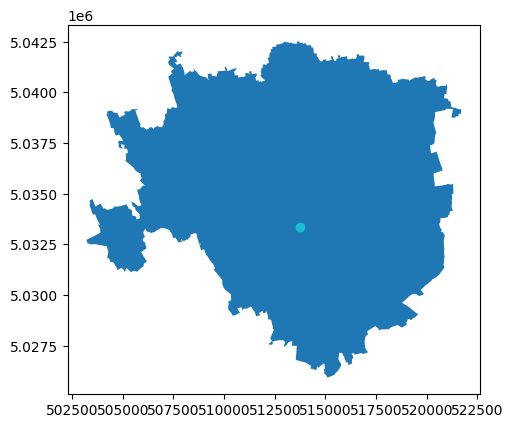

In [ ]:
hypotetical_stations = pd.DataFrame([
    {
        'name': "Darsena",
        'lat': "45.453727831592055",
        'lon': "9.175526990488676",
    }
])
hypotetical_stations["dataset"] = "hypotetical_station"
hypotetical_stations = gpd.GeoDataFrame(hypotetical_stations, geometry=gpd.points_from_xy(hypotetical_stations.lon, hypotetical_stations.lat), crs="EPSG:4326")
hypotetical_stations = hypotetical_stations.to_crs("epsg:32632")
gplot_milano(hypotetical_stations)

## Generate stations

In [ ]:
concatenated_stations

,id,name,geometry,dataset,latitudine,longitudine
0,44216,Centro,POINT (514254.769 5034260.134),sc_chosen_stations,5.034260e+06,514254.768800
1,40256,Porta Vittoria,POINT (516400.569 5034308.395),sc_chosen_stations,5.034308e+06,516400.568968
2,32399,Via Meda,POINT (513926.824 5031844.054),sc_chosen_stations,5.031844e+06,513926.823619
3,70169,Lodi,POINT (516599.959 5032086.080),sc_chosen_stations,5.032086e+06,516599.959025
4,50128,Piazza Leonardo,POINT (517514.386 5036052.144),sc_chosen_stations,5.036052e+06,517514.386254
5,32393,Via Ripamonti Fine,POINT (516145.039 5030310.204),sc_chosen_stations,5.030310e+06,516145.039236
6,22851,Forlanini,POINT (518761.742 5034068.738),sc_chosen_stations,5.034069e+06,518761.742008
7,24644,Villapizzone,POINT (511392.183 5038741.671),sc_chosen_stations,5.038742e+06,511392.183023
8,2,via Pascal *,POINT (518351.042 5035645.702),stations_milano,5.035646e+06,518351.042247
9,4,viale Marche,POINT (514910.677 5038103.127),stations_milano,5.038103e+06,514910.676585


In [ ]:
concatenated_stations.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
del hypotetical_stations["lat"]
del hypotetical_stations["lon"]

In [ ]:
hypotetical_stations["id"] = 111

In [ ]:
hypotetical_stations["latitudine"] = hypotetical_stations.geometry.y
hypotetical_stations["longitudine"] = hypotetical_stations.geometry.x

In [ ]:
hypotetical_stations

,name,dataset,geometry,id,latitudine,longitudine
0,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901


In [ ]:
concatenated_stations_hypotetical = gpd.GeoDataFrame(
    pd.concat([concatenated_stations, hypotetical_stations]),
    crs = concatenated_stations.crs
)

## Generate areas

In [ ]:
green_points.shape

In [ ]:
colonne = ['natural', 'geometry', 'distance', 'raggio', 'angolo', 'settore', 'area']
green_points_hypotetical_2 = gpd.GeoDataFrame(columns=['stazione'] + colonne, crs = "EPSG:32632")
#for idx, stazione in concatenated_stations.iterrows():
stazione = hypotetical_stations.iloc[0]
green_points_hypotetical_2 = divide_in_areas(stazione.geometry, green_points)
green_points_hypotetical_2 = green_points_hypotetical_2[colonne]
green_points_hypotetical_2['stazione'] = stazione['id']
green_points_hypotetical_2.head()

,natural,geometry,distance,raggio,angolo,settore,area,stazione
0,tree,POINT (515915.156 5034614.305),2518.903030,inf,60.418092,2,inf-2,111
1,tree,POINT (512093.888 5031588.334),2415.862256,inf,-137.546003,5,inf-5,111
2,tree,POINT (512099.357 5031575.631),2421.576035,inf,-137.844371,5,inf-5,111
3,tree,POINT (511975.307 5031540.218),2532.002876,inf,-136.301035,5,inf-5,111
4,tree,POINT (512073.909 5031543.373),2462.570218,inf,-137.909156,5,inf-5,111
5,tree,POINT (512119.871 5031536.257),2437.352781,inf,-138.823096,5,inf-5,111
6,tree,POINT (511932.441 5031488.433),2599.061418,inf,-136.406530,5,inf-5,111
7,tree,POINT (512090.149 5031515.434),2472.609548,inf,-138.622400,5,inf-5,111
8,tree,POINT (511917.377 5031526.123),2582.415732,inf,-135.587837,5,inf-5,111
9,tree,POINT (511960.635 5031528.324),2550.739546,inf,-136.247351,5,inf-5,111


In [ ]:
green_points_hypotetical_2.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
green_divided_in_areas.head()

In [ ]:
green_divided_in_areas = gpd.GeoDataFrame(pd.concat([green_divided_in_areas, green_points_hypotetical_2]), crs = green_points_hypotetical_2.crs)

In [ ]:
colonne = ['geometry', 'distance', 'raggio', 'angolo', 'settore', 'area']
buildings_points_hypotetical_2 = gpd.GeoDataFrame(columns=['stazione'] + colonne, crs = "EPSG:32632")
#for idx, stazione in concatenated_stations.iterrows():
stazione = hypotetical_stations.iloc[0]
buildings_points_hypotetical_2 = divide_in_areas(stazione.geometry, buildings_points)
buildings_points_hypotetical_2 = buildings_points_hypotetical_2[colonne]
buildings_points_hypotetical_2['stazione'] = stazione['id']
buildings_points_hypotetical_2 = gpd.GeoDataFrame(buildings_points_hypotetical_2)
buildings_points_hypotetical_2.head()

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
buildings_points_hypotetical_2.head()

,geometry,distance,raggio,angolo,settore,area,stazione
0,POINT (512229.779 5034988.595),2202.658963,inf,-42.737401,8,inf-8,111
1,POINT (512025.919 5034812.523),2228.011734,inf,-49.677644,7,inf-7,111
2,POINT (512045.843 5034195.149),1870.223369,2000.0,-63.846776,7,2000.0-7,111
3,POINT (512217.325 5034371.292),1809.094274,2000.0,-56.424732,7,2000.0-7,111
4,POINT (515892.385 5036926.663),4164.548215,inf,31.368173,1,inf-1,111


In [ ]:
buildings_divided_in_areas = gpd.GeoDataFrame(pd.concat([buildings_divided_in_areas, buildings_points_hypotetical_2]), crs = buildings_points_hypotetical_2.crs)

In [ ]:
buildings_points_hypotetical_2.crs

## Hypotetical station augmentation

In [ ]:
hypotetical_stations[["green_"+a for a in all_natural_and_areas()]] = hypotetical_stations.apply(augmentation_green(hypotetical_stations.crs), axis=1)
hypotetical_stations

TypeError: provide geometry or None as fill value

In [ ]:
#hypotetical_stations[["green_"+a for a in all_natural_and_areas()]] = 0

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joinin

In [ ]:
hypotetical_stations[["buildings_"+a for a in all_areas()]] = hypotetical_stations.apply(augmentation_buildings(hypotetical_stations.crs), axis=1)
hypotetical_stations

,name,dataset,geometry,id,latitudine,longitudine,buildings_100.0-1,buildings_100.0-2,buildings_100.0-3,buildings_100.0-4,...,buildings_1000.0-7,buildings_1000.0-8,buildings_2000.0-1,buildings_2000.0-2,buildings_2000.0-3,buildings_2000.0-4,buildings_2000.0-5,buildings_2000.0-6,buildings_2000.0-7,buildings_2000.0-8
0,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,1676,2774,13261,9648,4430,3312,2571,2754,3613,10666


In [ ]:
hypotetical_stations

,name,dataset,geometry,id,latitudine,longitudine,buildings_100.0-1,buildings_100.0-2,buildings_100.0-3,buildings_100.0-4,...,green_tree_group-1000.0-7,green_tree_group-1000.0-8,green_tree_group-2000.0-1,green_tree_group-2000.0-2,green_tree_group-2000.0-3,green_tree_group-2000.0-4,green_tree_group-2000.0-5,green_tree_group-2000.0-6,green_tree_group-2000.0-7,green_tree_group-2000.0-8
0,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Final hypotetical

In [ ]:
n_rows = 12
air_hypotetical_station = pd.DataFrame({'id': np.repeat(111, n_rows)})
for i in range(1, 13):
    air_hypotetical_station[f'month_{i}'] = np.where(np.arange(n_rows) == i-1, True, False)
air_hypotetical_station

,id,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,111,True,False,False,False,False,False,False,False,False,False,False,False
1,111,False,True,False,False,False,False,False,False,False,False,False,False
2,111,False,False,True,False,False,False,False,False,False,False,False,False
3,111,False,False,False,True,False,False,False,False,False,False,False,False
4,111,False,False,False,False,True,False,False,False,False,False,False,False
5,111,False,False,False,False,False,True,False,False,False,False,False,False
6,111,False,False,False,False,False,False,True,False,False,False,False,False
7,111,False,False,False,False,False,False,False,True,False,False,False,False
8,111,False,False,False,False,False,False,False,False,True,False,False,False
9,111,False,False,False,False,False,False,False,False,False,True,False,False


In [ ]:
hypotetical_stations.id = hypotetical_stations.id.astype(int)
final_hypotetical = pd.merge(hypotetical_stations, air_hypotetical_station, on="id")
final_hypotetical

,name,dataset,geometry,id,latitudine,longitudine,buildings_100.0-1,buildings_100.0-2,buildings_100.0-3,buildings_100.0-4,...,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,False,False,False,False,False,False,False,False,False
1,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,False,False,False,False,False,False,False,False,False
2,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,True,False,False,False,False,False,False,False,False,False
3,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,True,False,False,False,False,False,False,False,False
4,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,False,True,False,False,False,False,False,False,False
5,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,False,False,True,False,False,False,False,False,False
6,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,False,False,False,True,False,False,False,False,False
7,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,False,False,False,False,True,False,False,False,False
8,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,False,False,False,False,False,True,False,False,False
9,Darsena,hypotetical_station,POINT (513724.590 5033370.805),111,5.033371e+06,513724.5901,2,0,0,0,...,False,False,False,False,False,False,False,True,False,False


In [ ]:
final_hypotetical = sum_per_ring(final_hypotetical)

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joinin

In [ ]:
final_hypotetical["PM10"] = 0
final_hypotetical = final_hypotetical[final_feature_selection]
del final_hypotetical["PM10"]

In [ ]:
final_hypotetical.head()

,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,...,buildings_2000,green_grassland-100,green_grassland-200,green_grassland-500,green_grassland-1000,green_grassland-2000,green_wood-1000,green_wood-2000,green_tree_row-1000,green_tree_row-2000
0,False,False,False,False,False,False,False,False,False,False,...,50255,0,0,0,0,0,0,0,0,0
1,True,False,False,False,False,False,False,False,False,False,...,50255,0,0,0,0,0,0,0,0,0
2,False,True,False,False,False,False,False,False,False,False,...,50255,0,0,0,0,0,0,0,0,0
3,False,False,True,False,False,False,False,False,False,False,...,50255,0,0,0,0,0,0,0,0,0
4,False,False,False,True,False,False,False,False,False,False,...,50255,0,0,0,0,0,0,0,0,0


## Prediction

In [ ]:
p = btree.predict(final_hypotetical)
p

array([25.25460965, 46.95830488, 23.10495542, 13.28749481, 12.73660845,
       13.32306075, 13.1466447 , 12.52759318, 16.0591729 , 26.45030541,
       22.19366032, 40.47103611])

In [ ]:
p.mean()

22.126120548004916

In [ ]:
final["PM10"].mean()

22.37185911259785